# **Libraries**

In [112]:
!pip install python-Levenshtein

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.4/169.4 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 41.2 MB/s eta 0:00:00


In [113]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import torch as pt
import Levenshtein as lev

In [3]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [72]:
!ls drive/MyDrive/Oslo/data/ireceptor/output/esm2

H_CDR3.pt  old	TSNE_H_CDR3.pkl  UMAP_H_CDR3.pkl


# **Prepare all_data datasets**

In [52]:
# Load covabdab metadata df
covabdab_metadata = pd.read_csv(f'drive/MyDrive/Oslo/data/covabdab/covabdab.csv', sep=',')
columns_to_keep = ['Protein + Epitope', 'CDRH3', 'Heavy V Gene', 'Heavy J Gene']
columns_to_drop = covabdab_metadata.columns.difference(columns_to_keep)
covabdab_metadata = covabdab_metadata.drop(columns=columns_to_drop)
covabdab_metadata = covabdab_metadata.rename(columns={'Heavy V Gene': 'v_call', 'Heavy J Gene': 'j_call', 'CDRH3': 'junction_aa'})
covabdab_metadata['dataset'] = 'covabdab'
covabdab_metadata['id'] = range(1, len(covabdab_metadata) + 1)

covabdab_metadata

,Protein + Epitope,v_call,j_call,junction_aa,dataset,id
0,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARDLVVYGLDYW,covabdab,1
1,S; RBD,IGHV3-11 (Human),IGHJ4 (Human),CAREFDLTKIIMVPPYW,covabdab,2
2,S; RBD,IGHV3-30 (Human),IGHJ4 (Human),CARDSSGWHWGVPFDYW,covabdab,3
3,S; RBD,IGHV3-53 (Human),IGHJ3 (Human),CVRGSGGIHDAFDIW,covabdab,4
4,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARVDPRYEGFDYW,covabdab,5
...,...,...,...,...,...,...
12530,S; RBD,IGHV3-21 (Human),IGHJ5 (Human),CARDRFGEFIYPGALDIW,covabdab,12531
12531,S; RBD,IGHV1-58 (Human),IGHJ2 (Human),CAAMVRGGWWYFDLW,covabdab,12532
12532,S; RBD,IGHV3-11 (Human),IGHJ1 (Human),CASDPGGLSELAAEYFHHW,covabdab,12533
12533,S; RBD,IGHV3-64 (Human),IGHJ2 (Human),CARESTEVTHWYFDLW,covabdab,12534


In [53]:
# Load trastuzumab metadata df
trastuzumab_metadata = pd.read_csv(f'drive/MyDrive/Oslo/data/trastuzumab/Merged_unique.csv', sep=',')
trastuzumab_metadata = trastuzumab_metadata.rename(columns={'count': 'duplicate_count', 'aa_cdr3_seq': 'junction_aa'})
trastuzumab_metadata['dataset'] = 'trastuzumab'

trastuzumab_metadata

,junction_aa,duplicate_count,affinity,id,dataset
0,CSRIASVAFTCSLYW,14426,lb,1,trastuzumab
1,CSRIASGLLTLYHYW,10086,lb,2,trastuzumab
2,CSRWATFGLYAHRYW,9139,lb,3,trastuzumab
3,CSRWSMFGLYTFCYW,8237,lb,4,trastuzumab
4,CSRYVTNGFYAYHYW,8063,lb,5,trastuzumab
...,...,...,...,...,...
524341,CSRWYVSCFYVNPYW,2,mb,524342,trastuzumab
524342,CSRYAIRGHYQFLYW,2,mb,524343,trastuzumab
524343,CSRFSESSCYDIRYW,2,mb,524344,trastuzumab
524344,CSRFSGGHFYMLDYW,2,mb,524345,trastuzumab


In [54]:
# Load ireceptor metadata df
ireceptor_metadata = pd.read_csv(f'drive/MyDrive/Oslo/data/ireceptor/H_CDR3.csv', sep=';')
columns_to_keep = ['v_call', 'j_call', 'd_call', 'c_call', 'junction_aa', 'id', 'duplicate_count', 'repertoire_id']
columns_to_drop = ireceptor_metadata.columns.difference(columns_to_keep)
ireceptor_metadata = ireceptor_metadata.drop(columns=columns_to_drop)
ireceptor_metadata['dataset'] = 'ireceptor'

ireceptor_metadata

,v_call,d_call,j_call,c_call,junction_aa,duplicate_count,repertoire_id,id,dataset
0,IGHV3-23*01,IGHD3-16*01,IGHJ4*02,IgM,CAKCGDGIYADYYFDYW,NaN,4941241542787076586-242ac113-0001-012,1,ireceptor
1,IGHV3-30*18,IGHD4-17*01,IGHJ4*02,IgM,CAKGGGTVTTGGFDYW,NaN,4250138355187716586-242ac113-0001-012,2,ireceptor
2,IGHV3-23*01,IGHD3-22*01,IGHJ5*02,IgM,CAKDSSAWSKDSW,NaN,401804708298756586-242ac113-0001-012,3,ireceptor
3,IGHV4-59*10,IGHD3-22*01,IGHJ4*02,IgM,CARETYYYDSSGYYINYFDYW,NaN,1025069326778428950-242ac113-0001-012,4,ireceptor
4,IGHV4-31*03,IGHD3-10*01,IGHJ4*02,IgM,CAREGVNRTWFGELSPPYFDYW,NaN,2690893428047876586-242ac113-0001-012,5,ireceptor
...,...,...,...,...,...,...,...,...,...
799995,IGHV1-8*02,IGHD3-22*01,IGHJ4*02,IgM,CARGTIAVANDYW,NaN,1279975635796028950-242ac113-0001-012,799996,ireceptor
799996,IGHV3-30*04,IGHD3-16*01,IGHJ3*02,IgG1,CARVPDFGELQLFAYDIW,NaN,667104838172676586-242ac113-0001-012,799997,ireceptor
799997,IGHV4-59*01,IGHD3-10*02,IGHJ4*02,IgM,CARASVLLSADFW,NaN,1137382721568828950-242ac113-0001-012,799998,ireceptor
799998,IGHV1-2*03,IGHD2-8*02,IGHJ4*02,IgM,CARVRVVNSKAFDYW,NaN,891281095508028950-242ac113-0001-012,799999,ireceptor


In [55]:
merged = pd.concat([covabdab_metadata, trastuzumab_metadata, ireceptor_metadata], axis=0)
merged

,Protein + Epitope,v_call,j_call,junction_aa,dataset,id,duplicate_count,affinity,d_call,c_call,repertoire_id
0,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARDLVVYGLDYW,covabdab,1,NaN,NaN,NaN,NaN,NaN
1,S; RBD,IGHV3-11 (Human),IGHJ4 (Human),CAREFDLTKIIMVPPYW,covabdab,2,NaN,NaN,NaN,NaN,NaN
2,S; RBD,IGHV3-30 (Human),IGHJ4 (Human),CARDSSGWHWGVPFDYW,covabdab,3,NaN,NaN,NaN,NaN,NaN
3,S; RBD,IGHV3-53 (Human),IGHJ3 (Human),CVRGSGGIHDAFDIW,covabdab,4,NaN,NaN,NaN,NaN,NaN
4,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARVDPRYEGFDYW,covabdab,5,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
799995,NaN,IGHV1-8*02,IGHJ4*02,CARGTIAVANDYW,ireceptor,799996,NaN,NaN,IGHD3-22*01,IgM,1279975635796028950-242ac113-0001-012
799996,NaN,IGHV3-30*04,IGHJ3*02,CARVPDFGELQLFAYDIW,ireceptor,799997,NaN,NaN,IGHD3-16*01,IgG1,667104838172676586-242ac113-0001-012
799997,NaN,IGHV4-59*01,IGHJ4*02,CARASVLLSADFW,ireceptor,799998,NaN,NaN,IGHD3-10*02,IgM,1137382721568828950-242ac113-0001-012
799998,NaN,IGHV1-2*03,IGHJ4*02,CARVRVVNSKAFDYW,ireceptor,799999,NaN,NaN,IGHD2-8*02,IgM,891281095508028950-242ac113-0001-012


In [56]:
filtered = merged.drop_duplicates(subset=['junction_aa'], keep='first')

# Create WT trastuzumab row to append
new_data = pd.DataFrame({"duplicate_count": [1], "junction_aa": ["CSRWGGDGFYAMDYW"], "dataset": ["trastuzumab"], "affinity": ["hb"]})
# Append the new data to the dataframe
filtered = filtered.append(new_data, ignore_index=True)

filtered['id'] = range(1, len(filtered) + 1)
filtered['junction_length'] = filtered['junction_aa'].apply(len)

filtered

<ipython-input-56-bacaa1e9ddf7>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  filtered = filtered.append(new_data, ignore_index=True)


,Protein + Epitope,v_call,j_call,junction_aa,dataset,id,duplicate_count,affinity,d_call,c_call,repertoire_id,junction_length
0,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARDLVVYGLDYW,covabdab,1,NaN,NaN,NaN,NaN,NaN,13
1,S; RBD,IGHV3-11 (Human),IGHJ4 (Human),CAREFDLTKIIMVPPYW,covabdab,2,NaN,NaN,NaN,NaN,NaN,17
2,S; RBD,IGHV3-30 (Human),IGHJ4 (Human),CARDSSGWHWGVPFDYW,covabdab,3,NaN,NaN,NaN,NaN,NaN,17
3,S; RBD,IGHV3-53 (Human),IGHJ3 (Human),CVRGSGGIHDAFDIW,covabdab,4,NaN,NaN,NaN,NaN,NaN,15
4,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARVDPRYEGFDYW,covabdab,5,NaN,NaN,NaN,NaN,NaN,14
...,...,...,...,...,...,...,...,...,...,...,...,...
1335759,NaN,IGHV3-30*04,IGHJ3*02,CARVPDFGELQLFAYDIW,ireceptor,1335760,NaN,NaN,IGHD3-16*01,IgG1,667104838172676586-242ac113-0001-012,18
1335760,NaN,IGHV4-59*01,IGHJ4*02,CARASVLLSADFW,ireceptor,1335761,NaN,NaN,IGHD3-10*02,IgM,1137382721568828950-242ac113-0001-012,13
1335761,NaN,IGHV1-2*03,IGHJ4*02,CARVRVVNSKAFDYW,ireceptor,1335762,NaN,NaN,IGHD2-8*02,IgM,891281095508028950-242ac113-0001-012,15
1335762,NaN,IGHV4-30-2*01,IGHJ4*02,CARVDTAMVGGDYW,ireceptor,1335763,NaN,NaN,IGHD5-5*01,IgM,2942020165844996586-242ac113-0001-012,14


In [23]:
filtered.to_csv('/content/drive/MyDrive/Oslo/data/all_data.csv', index=False, sep=';')

with open('/content/drive/MyDrive/Oslo/data/all_data.fa', 'w') as file:
    for index, row in filtered.iterrows():
        id = row['id']
        cdr_aa = row['junction_aa']

        # Write the FASTA entry
        file.write(f'>{id}\n{cdr_aa}\n')

In [74]:
# Load OLGA's output
with open(f'drive/MyDrive/Oslo/data/all_data/output/olga/pgen_H_CDR3.fa', 'r') as file:
    lines = file.readlines()
data = [line.strip().split('\t') for line in lines]
pgen_df = pd.DataFrame(data, columns=['junction_aa', 'pgen'])
#pgen_df['id'] = range(1, len(pgen_df) + 1)
pgen_df['pgen'] = pgen_df['pgen'].astype(float)
pgen_df['log_pgen'] = pgen_df['pgen'].apply(lambda x: np.log(x))
pgen_df['log_pgen'].replace(-np.inf, np.nan, inplace=True)

pgen_df

,junction_aa,pgen,log_pgen
0,CARDLVVYGLDYW,6.100901e-11,-23.520000
1,CAREFDLTKIIMVPPYW,5.055947e-21,-46.733722
2,CARDSSGWHWGVPFDYW,3.699200e-14,-30.928075
3,CVRGSGGIHDAFDIW,1.130567e-13,-29.810887
4,CARVDPRYEGFDYW,3.661061e-13,-28.635853
...,...,...,...
1335759,CARVPDFGELQLFAYDIW,1.481166e-21,-47.961457
1335760,CARASVLLSADFW,1.766685e-15,-33.969671
1335761,CARVRVVNSKAFDYW,4.221661e-14,-30.795963
1335762,CARVDTAMVGGDYW,4.918103e-10,-21.432928


In [75]:
filtered = pd.merge(filtered, pgen_df, on='junction_aa')
filtered

,Protein + Epitope,v_call,j_call,junction_aa,dataset,id,duplicate_count,affinity,d_call,c_call,repertoire_id,junction_length,pgen,log_pgen
0,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARDLVVYGLDYW,covabdab,1,NaN,NaN,NaN,NaN,NaN,13,6.100901e-11,-23.520000
1,S; RBD,IGHV3-11 (Human),IGHJ4 (Human),CAREFDLTKIIMVPPYW,covabdab,2,NaN,NaN,NaN,NaN,NaN,17,5.055947e-21,-46.733722
2,S; RBD,IGHV3-30 (Human),IGHJ4 (Human),CARDSSGWHWGVPFDYW,covabdab,3,NaN,NaN,NaN,NaN,NaN,17,3.699200e-14,-30.928075
3,S; RBD,IGHV3-53 (Human),IGHJ3 (Human),CVRGSGGIHDAFDIW,covabdab,4,NaN,NaN,NaN,NaN,NaN,15,1.130567e-13,-29.810887
4,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARVDPRYEGFDYW,covabdab,5,NaN,NaN,NaN,NaN,NaN,14,3.661061e-13,-28.635853
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1335745,NaN,IGHV3-30*04,IGHJ3*02,CARVPDFGELQLFAYDIW,ireceptor,1335760,NaN,NaN,IGHD3-16*01,IgG1,667104838172676586-242ac113-0001-012,18,1.481166e-21,-47.961457
1335746,NaN,IGHV4-59*01,IGHJ4*02,CARASVLLSADFW,ireceptor,1335761,NaN,NaN,IGHD3-10*02,IgM,1137382721568828950-242ac113-0001-012,13,1.766685e-15,-33.969671
1335747,NaN,IGHV1-2*03,IGHJ4*02,CARVRVVNSKAFDYW,ireceptor,1335762,NaN,NaN,IGHD2-8*02,IgM,891281095508028950-242ac113-0001-012,15,4.221661e-14,-30.795963
1335748,NaN,IGHV4-30-2*01,IGHJ4*02,CARVDTAMVGGDYW,ireceptor,1335763,NaN,NaN,IGHD5-5*01,IgM,2942020165844996586-242ac113-0001-012,14,4.918103e-10,-21.432928


# **Add WT Trastuzumab sequence**

1. Preprocess the sequence with esm2
2. Add the .pt vector to all_data.pt
3. Run UMAP once again
4. Merge metadata and the new UMAP.pkl

# **Merge metadata and UMAPs**

In [114]:
umap_filtered = pd.DataFrame(pd.read_pickle(f'drive/MyDrive/Oslo/data/all_data/output/esm2/UMAP_all_data.pkl').values)
umap_filtered.columns = ['x', 'y']
umap_filtered['id'] = range(1, len(umap_filtered) + 1)

df = pd.merge(filtered, umap_filtered, on='id')

df['v_family'] = df['v_call'].str.split(r'[-/S ]').str[0]
df['d_family'] = df['d_call'].str.split(r'[-/ ]').str[0]
df['j_family'] = df['j_call'].str.split(r'[-*/ ]').str[0]

df['v_family'].fillna('nan', inplace=True)
df['d_family'].fillna('nan', inplace=True)
df['j_family'].fillna('nan', inplace=True)

# concatenate the three columns into 'vdj_comb'
df['vdj_comb'] = df.apply(lambda row: row['v_family'] + '_' + row['d_family'] + '_' + row['j_family'], axis=1)

# add pgen_len_ratio
df['pgen_len_ratio'] = df.apply(lambda row: row['log_pgen'] / row['junction_length'], axis=1)

# add levenshtein distance
wt_trastuzumab = 'CSRWGGDGFYAMDYW'
df['lev_dist'] = df['junction_aa'].apply(lambda x: lev.distance(x, wt_trastuzumab))

df

,Protein + Epitope,v_call,j_call,junction_aa,dataset,id,duplicate_count,affinity,d_call,c_call,...,pgen,log_pgen,x,y,v_family,d_family,j_family,vdj_comb,pgen_len_ratio,lev_dist
0,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARDLVVYGLDYW,covabdab,1,NaN,NaN,NaN,NaN,...,6.100901e-11,-23.520000,6.996923,4.879407,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-1.809231,9
1,S; RBD,IGHV3-11 (Human),IGHJ4 (Human),CAREFDLTKIIMVPPYW,covabdab,2,NaN,NaN,NaN,NaN,...,5.055947e-21,-46.733722,7.320460,3.036455,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-2.749042,12
2,S; RBD,IGHV3-30 (Human),IGHJ4 (Human),CARDSSGWHWGVPFDYW,covabdab,3,NaN,NaN,NaN,NaN,...,3.699200e-14,-30.928075,9.941292,5.166597,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-1.819299,11
3,S; RBD,IGHV3-53 (Human),IGHJ3 (Human),CVRGSGGIHDAFDIW,covabdab,4,NaN,NaN,NaN,NaN,...,1.130567e-13,-29.810887,7.478525,4.090193,IGHV3,nan,IGHJ3,IGHV3_nan_IGHJ3,-1.987392,9
4,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARVDPRYEGFDYW,covabdab,5,NaN,NaN,NaN,NaN,...,3.661061e-13,-28.635853,8.775270,3.509120,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-2.045418,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1335745,NaN,IGHV3-30*04,IGHJ3*02,CARVPDFGELQLFAYDIW,ireceptor,1335760,NaN,NaN,IGHD3-16*01,IgG1,...,1.481166e-21,-47.961457,7.741778,3.778868,IGHV3,IGHD3,IGHJ3,IGHV3_IGHD3_IGHJ3,-2.664525,12
1335746,NaN,IGHV4-59*01,IGHJ4*02,CARASVLLSADFW,ireceptor,1335761,NaN,NaN,IGHD3-10*02,IgM,...,1.766685e-15,-33.969671,6.814017,4.476988,IGHV4,IGHD3,IGHJ4,IGHV4_IGHD3_IGHJ4,-2.613052,10
1335747,NaN,IGHV1-2*03,IGHJ4*02,CARVRVVNSKAFDYW,ireceptor,1335762,NaN,NaN,IGHD2-8*02,IgM,...,4.221661e-14,-30.795963,6.690963,5.251065,IGHV1,IGHD2,IGHJ4,IGHV1_IGHD2_IGHJ4,-2.053064,9
1335748,NaN,IGHV4-30-2*01,IGHJ4*02,CARVDTAMVGGDYW,ireceptor,1335763,NaN,NaN,IGHD5-5*01,IgM,...,4.918103e-10,-21.432928,5.796249,1.751191,IGHV4,IGHD5,IGHJ4,IGHV4_IGHD5_IGHJ4,-1.530923,10


# **Plots**

In [ ]:
!rm *

rm: cannot remove 'drive': Is a directory
rm: cannot remove 'sample_data': Is a directory


In [77]:
dataset_name = 'all_H_CDR3'
model_name = 'esm2'
red = 'UMAP'

## **Feature distributions**

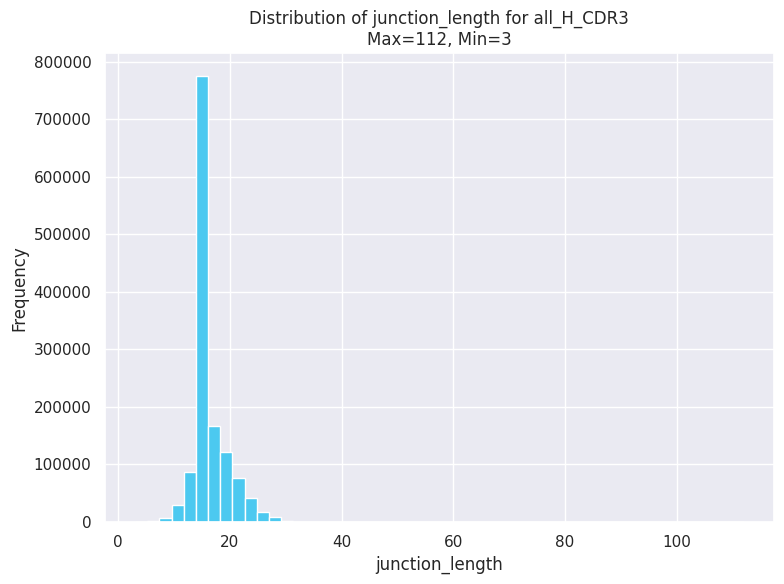

Max:  112
Min:  3


In [100]:
label = 'junction_length'

data = df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}\nMax={round(df[label].max(), 2)}, Min={round(df[label].min(), 2)}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

print('Max: ', df[label].max())
print('Min: ', df[label].min())

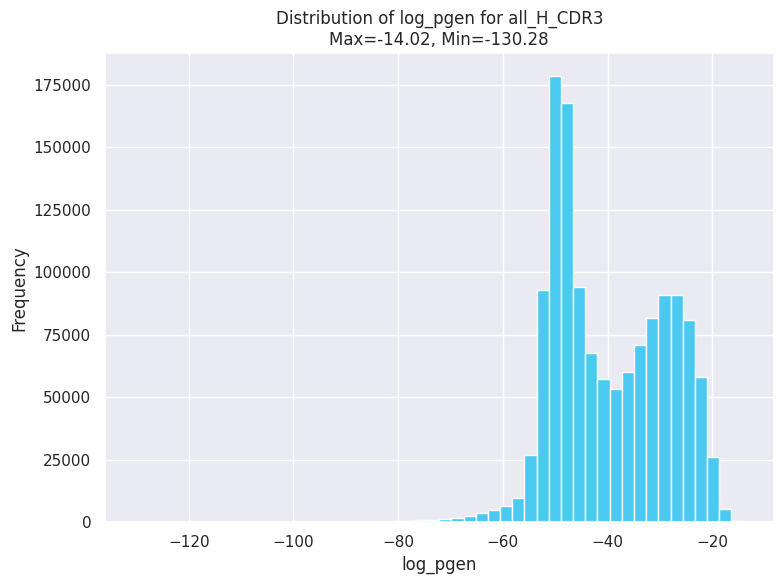

Max:  -14.017096638858614
Min:  -130.27890683441964


In [90]:
label = 'log_pgen'

data = df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}\nMax={round(df[label].max(), 2)}, Min={round(df[label].min(), 2)}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

print('Max: ', df[label].max())
print('Min: ', df[label].min())

In [116]:
filtered_df = df[(df['junction_length'] >= 7) & (df['junction_length'] <= 30) & (df['log_pgen'] >= -80)]

filtered_df

,Protein + Epitope,v_call,j_call,junction_aa,dataset,id,duplicate_count,affinity,d_call,c_call,...,pgen,log_pgen,x,y,v_family,d_family,j_family,vdj_comb,pgen_len_ratio,lev_dist
0,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARDLVVYGLDYW,covabdab,1,NaN,NaN,NaN,NaN,...,6.100901e-11,-23.520000,6.996923,4.879407,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-1.809231,9
1,S; RBD,IGHV3-11 (Human),IGHJ4 (Human),CAREFDLTKIIMVPPYW,covabdab,2,NaN,NaN,NaN,NaN,...,5.055947e-21,-46.733722,7.320460,3.036455,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-2.749042,12
2,S; RBD,IGHV3-30 (Human),IGHJ4 (Human),CARDSSGWHWGVPFDYW,covabdab,3,NaN,NaN,NaN,NaN,...,3.699200e-14,-30.928075,9.941292,5.166597,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-1.819299,11
3,S; RBD,IGHV3-53 (Human),IGHJ3 (Human),CVRGSGGIHDAFDIW,covabdab,4,NaN,NaN,NaN,NaN,...,1.130567e-13,-29.810887,7.478525,4.090193,IGHV3,nan,IGHJ3,IGHV3_nan_IGHJ3,-1.987392,9
4,S; RBD,IGHV3-53 (Human),IGHJ4 (Human),CARVDPRYEGFDYW,covabdab,5,NaN,NaN,NaN,NaN,...,3.661061e-13,-28.635853,8.775270,3.509120,IGHV3,nan,IGHJ4,IGHV3_nan_IGHJ4,-2.045418,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1335745,NaN,IGHV3-30*04,IGHJ3*02,CARVPDFGELQLFAYDIW,ireceptor,1335760,NaN,NaN,IGHD3-16*01,IgG1,...,1.481166e-21,-47.961457,7.741778,3.778868,IGHV3,IGHD3,IGHJ3,IGHV3_IGHD3_IGHJ3,-2.664525,12
1335746,NaN,IGHV4-59*01,IGHJ4*02,CARASVLLSADFW,ireceptor,1335761,NaN,NaN,IGHD3-10*02,IgM,...,1.766685e-15,-33.969671,6.814017,4.476988,IGHV4,IGHD3,IGHJ4,IGHV4_IGHD3_IGHJ4,-2.613052,10
1335747,NaN,IGHV1-2*03,IGHJ4*02,CARVRVVNSKAFDYW,ireceptor,1335762,NaN,NaN,IGHD2-8*02,IgM,...,4.221661e-14,-30.795963,6.690963,5.251065,IGHV1,IGHD2,IGHJ4,IGHV1_IGHD2_IGHJ4,-2.053064,9
1335748,NaN,IGHV4-30-2*01,IGHJ4*02,CARVDTAMVGGDYW,ireceptor,1335763,NaN,NaN,IGHD5-5*01,IgM,...,4.918103e-10,-21.432928,5.796249,1.751191,IGHV4,IGHD5,IGHJ4,IGHV4_IGHD5_IGHJ4,-1.530923,10


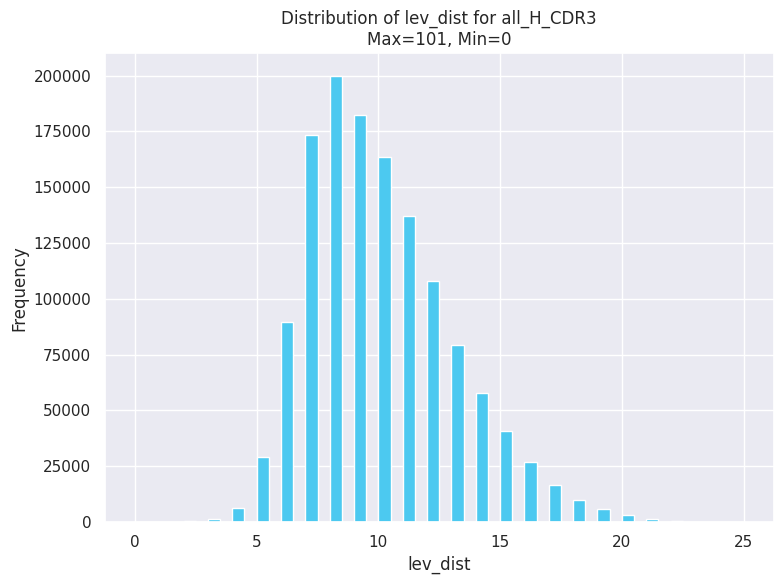

Max:  101
Min:  0


In [118]:
label = 'log_pgen'

data = filtered_df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}\nMax={round(df[label].max(), 2)}, Min={round(df[label].min(), 2)}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

print('Max: ', df[label].max())
print('Min: ', df[label].min())

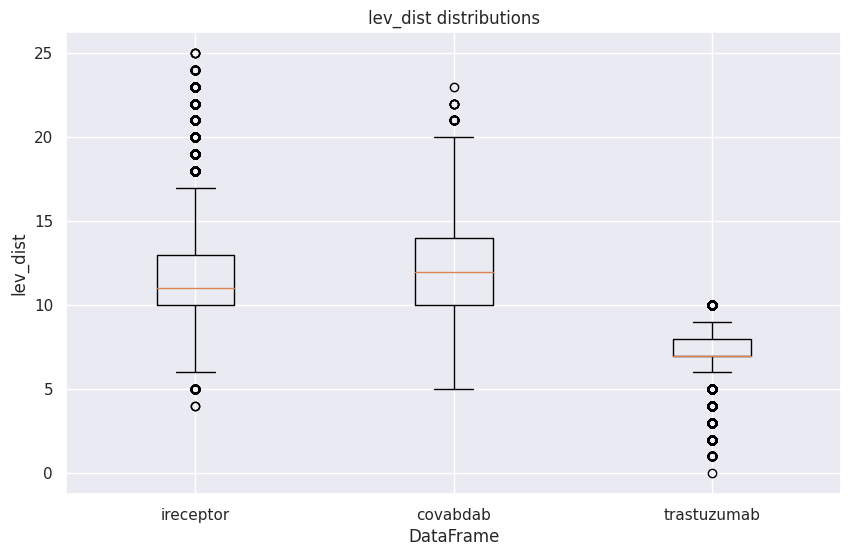

In [121]:
label = 'lev_dist'

# Extract the label column from each DataFrame
label_df1 = filtered_df[filtered_df['dataset'] == 'ireceptor'][label]
label_df2 = filtered_df[filtered_df['dataset'] == 'covabdab'][label]
label_df3 = filtered_df[filtered_df['dataset'] == 'trastuzumab'][label]

# Create a list of the extracted columns
data = [label_df1, label_df2, label_df3]

# Create a labels list to identify each dataset
labels = ['ireceptor', 'covabdab', 'trastuzumab']

# Create a boxplot to compare the distributions
plt.figure(figsize=(10, 6))
plt.boxplot(data, labels=labels)
plt.title(f'{label} distributions')
plt.xlabel('DataFrame')
plt.ylabel(f'{label}')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_datasets.png'
plt.savefig(filename)

plt.show()

In [ ]:
filtered_df.columns

Index(['Protein + Epitope', 'v_call', 'j_call', 'junction_aa', 'dataset', 'id',
       'duplicate_count', 'affinity', 'd_call', 'c_call', 'junction_length',
       'x', 'y', 'v_family', 'd_family', 'j_family'],
      dtype='object')

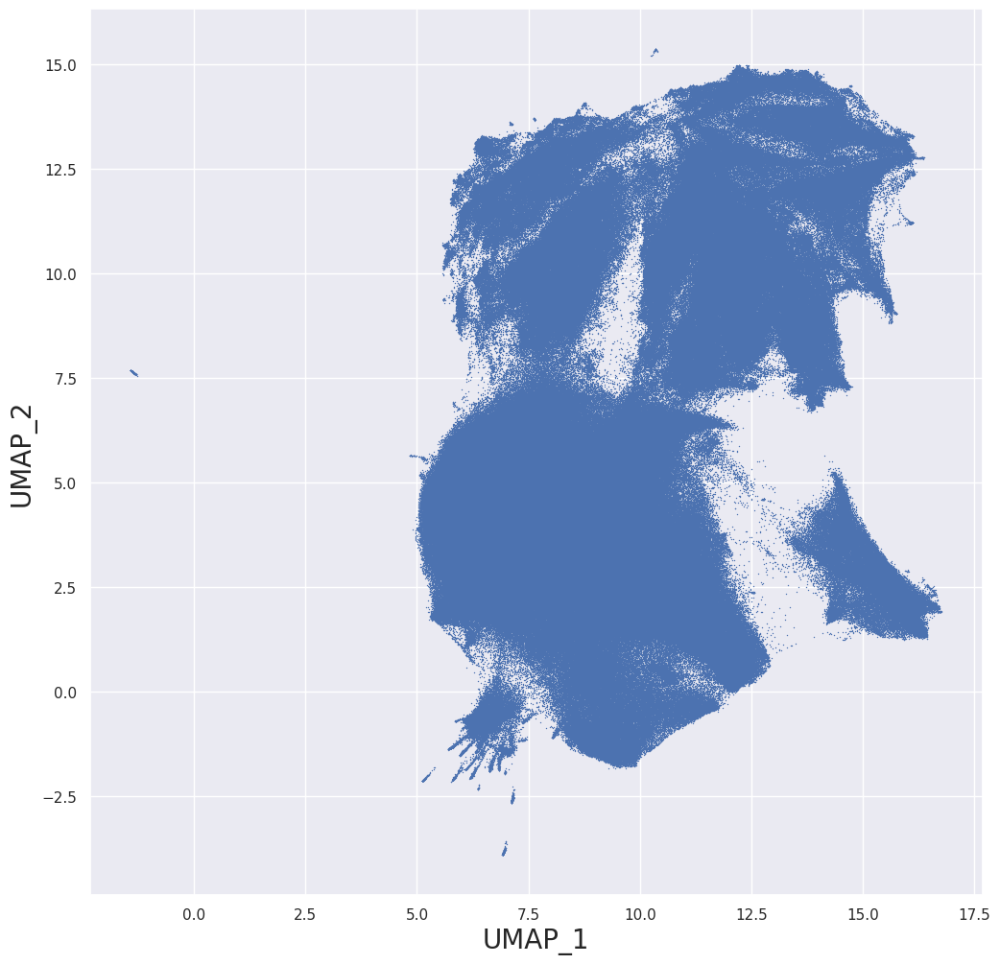

In [59]:
# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df, x='x', y='y', s=1, linewidth=0)

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}.png')
plt.show()

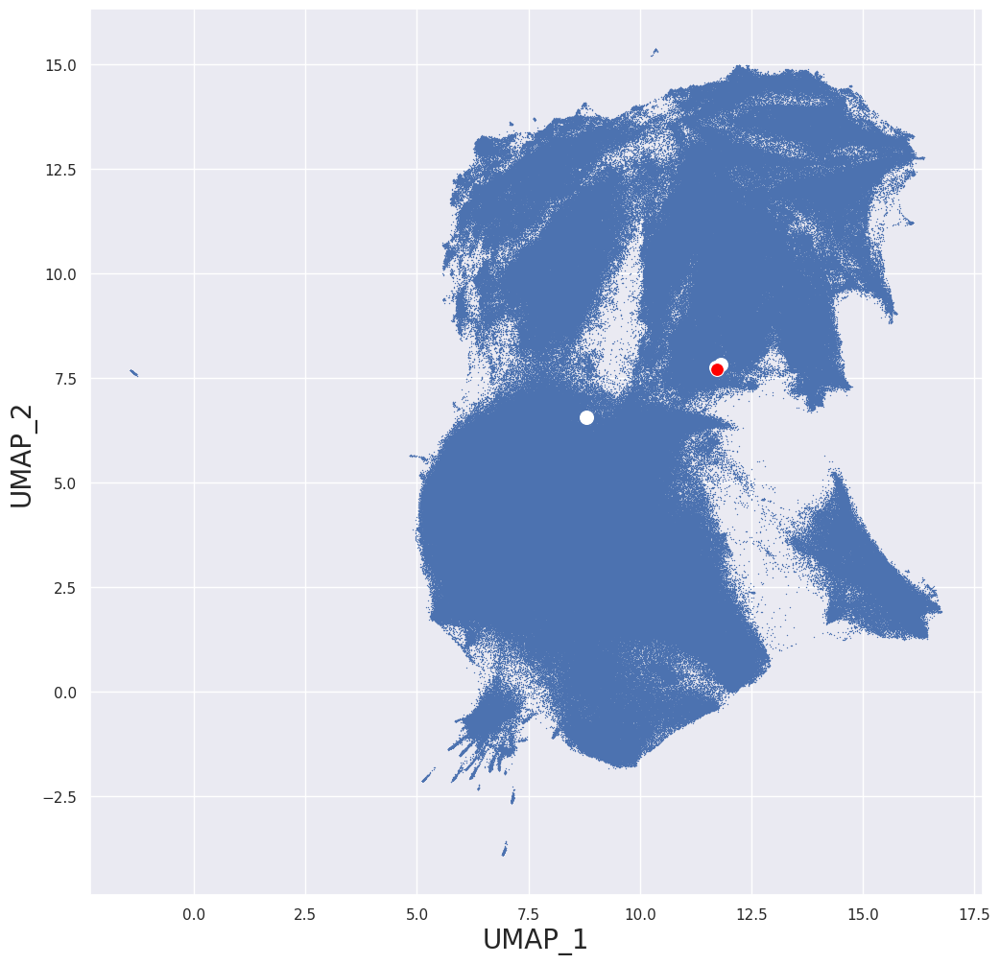

In [98]:
# Split the data
highlight_data = filtered_df[filtered_df["id"] == 1335764]
other_data = filtered_df[filtered_df["id"] != 1335764]

highlight_data2 = filtered_df[filtered_df["id"] == 193894]
highlight_data3 = filtered_df[filtered_df["id"] == 207844]
highlight_data4 = filtered_df[filtered_df["id"] == 204355]

# Create the scatterplot
plt.figure(figsize=(12, 12))

# Plot other data
scatter = sns.scatterplot(data=other_data, x='x', y='y', s=1, linewidth=0)

scatter = sns.scatterplot(data=highlight_data2, x='x', y='y', s=100, color='white')
scatter = sns.scatterplot(data=highlight_data3, x='x', y='y', s=100, color='white')
scatter = sns.scatterplot(data=highlight_data4, x='x', y='y', s=100, color='white')

# Plot highlighted data
scatter = sns.scatterplot(data=highlight_data, x='x', y='y', s=100, color='red')  # Change the size

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_WT_trastuzumab2.png')
plt.show()


## **Continuous variables**

In [104]:
!rm *

rm: cannot remove 'drive': Is a directory
rm: cannot remove 'sample_data': Is a directory


<ipython-input-122-48d86df4c95f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  original_cmap = cm.get_cmap(cmap_name)
<ipython-input-122-48d86df4c95f>:18: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, label=hue_name)


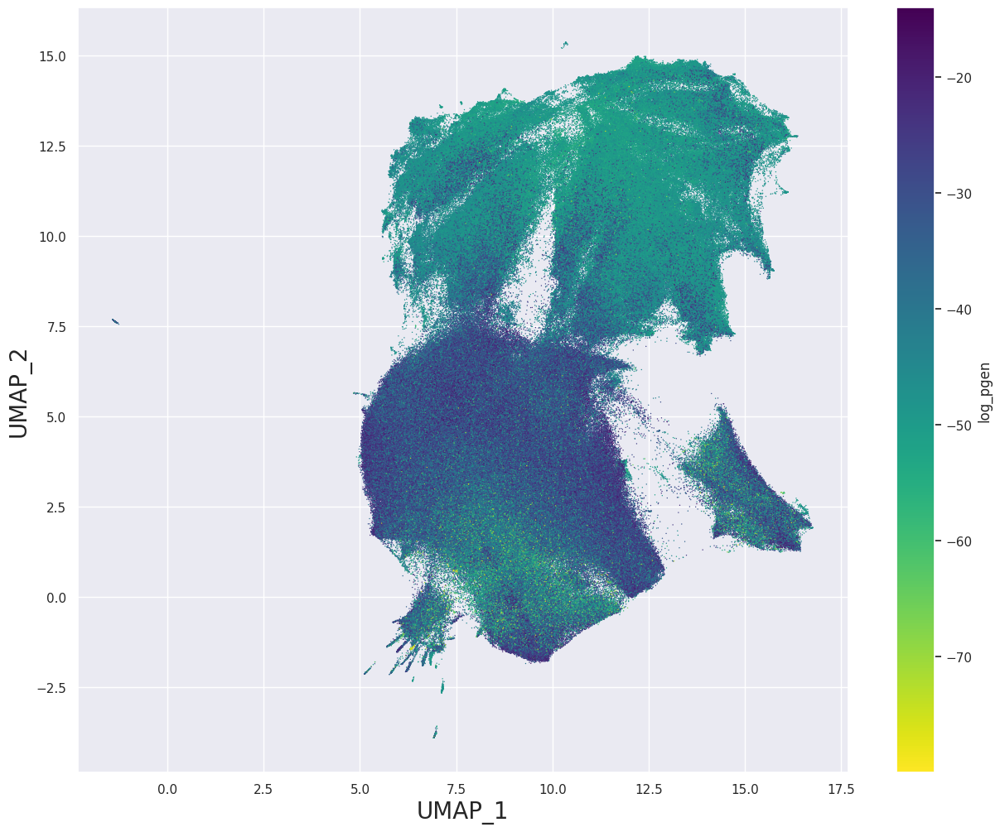

In [122]:
hue_name = 'log_pgen'
cmap_name = 'viridis'

original_cmap = cm.get_cmap(cmap_name)

# Reverse the colormap
reversed_cmap = mcolors.ListedColormap(original_cmap.colors[::-1])

# Create the scatterplot
plt.figure(figsize=(15, 12))
scatter = sns.scatterplot(data=filtered_df, x='x', y='y', s=1, linewidth=0, c=filtered_df[hue_name], cmap=reversed_cmap)

# Create a ScalarMappable for the colorbar
sm = cm.ScalarMappable(cmap=reversed_cmap, norm=plt.Normalize(vmin=filtered_df[hue_name].min(), vmax=filtered_df[hue_name].max()))
sm.set_array([])  # You need to set an empty array for it to work

# Add a colorbar for 'mu_freq_heavy'
cbar = plt.colorbar(sm, label=hue_name)

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}.png')
plt.show()

<ipython-input-123-c3af0b2c8ed4>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  original_cmap = cm.get_cmap(cmap_name)
<ipython-input-123-c3af0b2c8ed4>:18: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, label=hue_name)


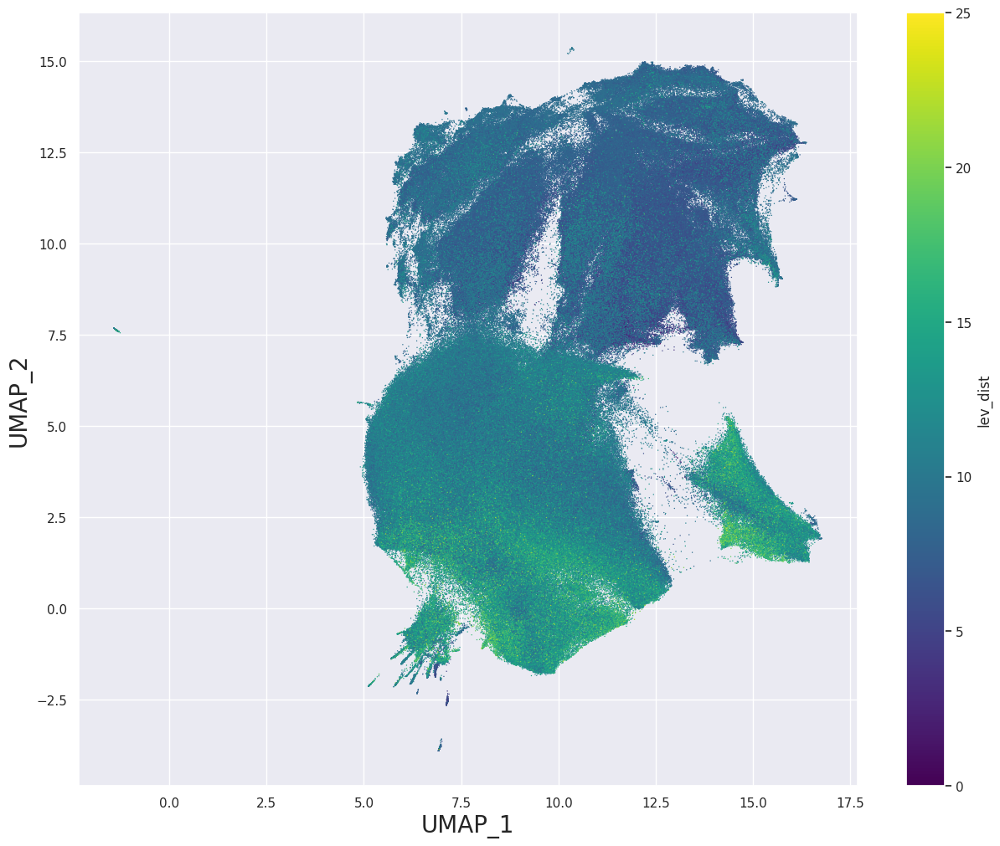

In [123]:
hue_name = 'lev_dist'
cmap_name = 'viridis'

original_cmap = cm.get_cmap(cmap_name)

# Reverse the colormap
reversed_cmap = mcolors.ListedColormap(original_cmap.colors[::-1])

# Create the scatterplot
plt.figure(figsize=(15, 12))
scatter = sns.scatterplot(data=filtered_df, x='x', y='y', s=1, linewidth=0, c=filtered_df[hue_name], cmap=cmap_name)

# Create a ScalarMappable for the colorbar
sm = cm.ScalarMappable(cmap=cmap_name, norm=plt.Normalize(vmin=filtered_df[hue_name].min(), vmax=filtered_df[hue_name].max()))
sm.set_array([])  # You need to set an empty array for it to work

# Add a colorbar for 'mu_freq_heavy'
cbar = plt.colorbar(sm, label=hue_name)

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}.png')
plt.show()

<ipython-input-124-85ecba42c697>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  original_cmap = cm.get_cmap(cmap_name)
<ipython-input-124-85ecba42c697>:18: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, label=hue_name)


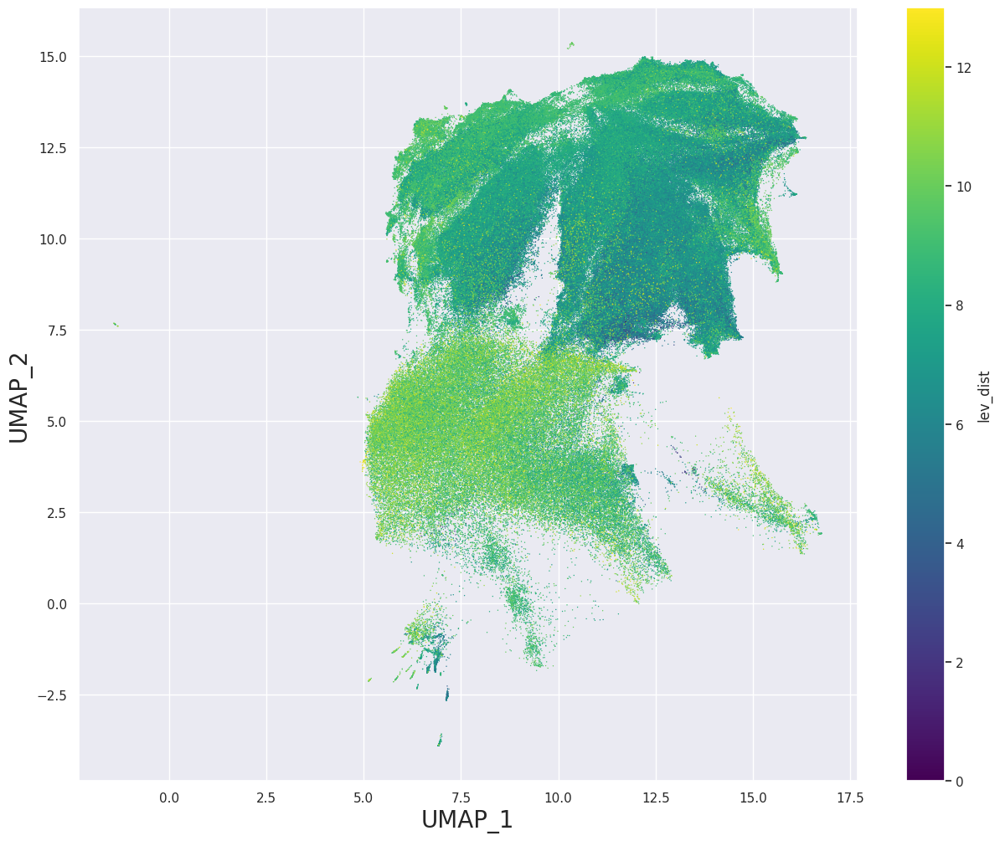

In [124]:
hue_name = 'lev_dist'
cmap_name = 'viridis'

original_cmap = cm.get_cmap(cmap_name)

# Reverse the colormap
reversed_cmap = mcolors.ListedColormap(original_cmap.colors[::-1])

# Create the scatterplot
plt.figure(figsize=(15, 12))
scatter = sns.scatterplot(data=filtered_df[filtered_df['junction_length'] == 15], x='x', y='y', s=1, linewidth=0, c=filtered_df[filtered_df['junction_length'] == 15][hue_name], cmap=cmap_name)

# Create a ScalarMappable for the colorbar
sm = cm.ScalarMappable(cmap=cmap_name, norm=plt.Normalize(vmin=filtered_df[filtered_df['junction_length'] == 15][hue_name].min(), vmax=filtered_df[filtered_df['junction_length'] == 15][hue_name].max()))
sm.set_array([])  # You need to set an empty array for it to work

# Add a colorbar for 'mu_freq_heavy'
cbar = plt.colorbar(sm, label=hue_name)

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}_15.png')
plt.show()

<Figure size 1200x1200 with 0 Axes>

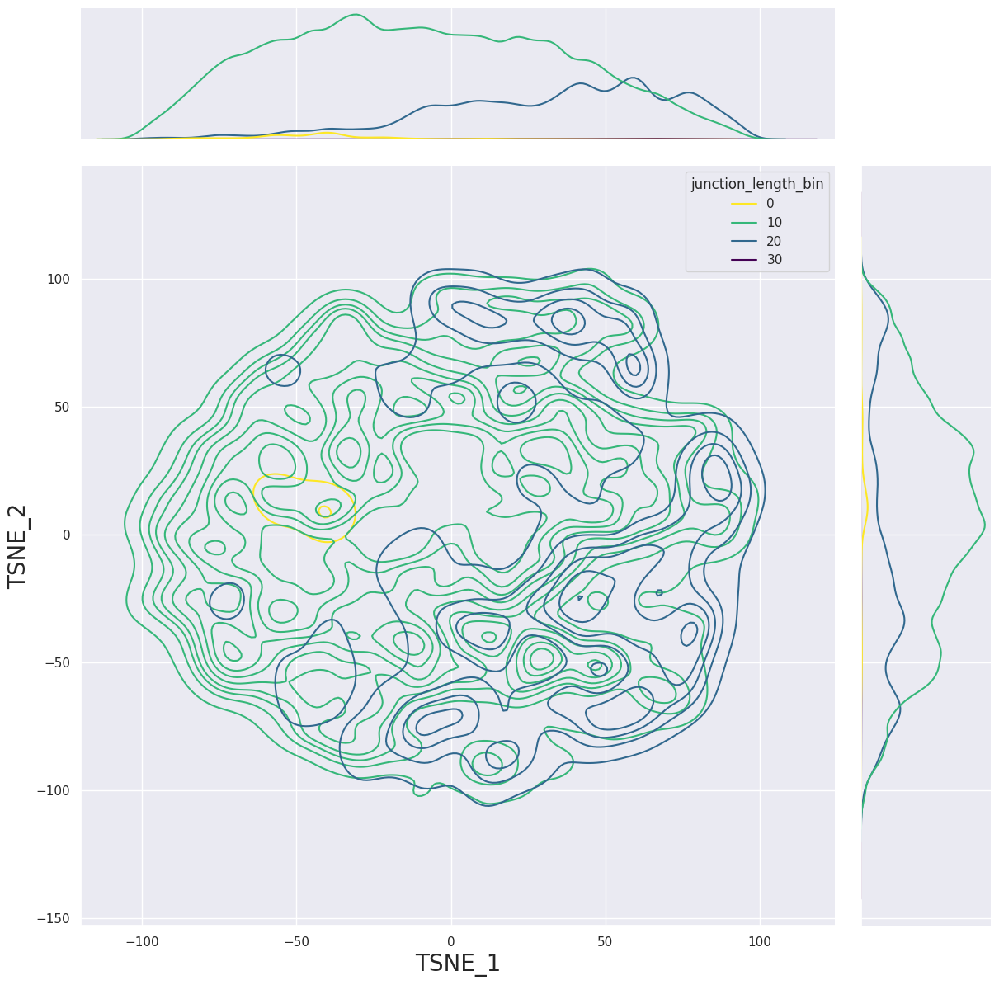

In [ ]:
hue_name = 'log_pgen'

# Calculate the bins for junction lengths with a bin width of 4
bin_width = 10
filtered_df[f'{hue_name}_bin'] = (filtered_df[hue_name] // bin_width) * bin_width

plt.figure(figsize=(12, 12))
#sns.kdeplot(data=umap_df, x='x', y='y', fill=True)
sns.jointplot(data=filtered_df, x='x', y='y', kind='kde', hue=f'{hue_name}_bin', fill=False, height=12, palette=reversed_cmap)
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)
plt.savefig(f'{model_name}_{red}_KDE_{dataset_name}_{hue_name}.png')
plt.show()

## **Class features**

In [29]:
filtered_df.columns

Index(['Protein + Epitope', 'v_call', 'j_call', 'junction_aa', 'dataset', 'id',
       'duplicate_count', 'affinity', 'd_call', 'c_call', 'repertoire_id',
       'junction_length', 'x', 'y', 'v_family', 'd_family', 'j_family'],
      dtype='object')

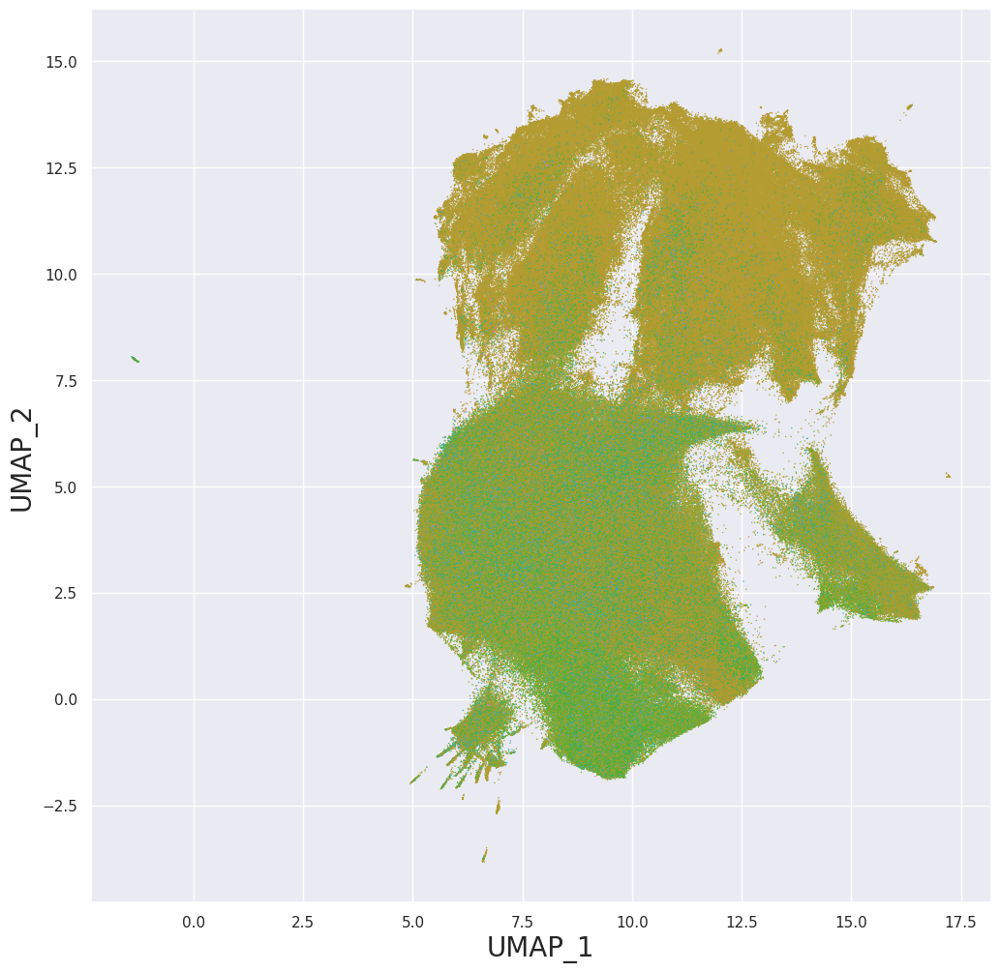

In [51]:
# Define hue_name
hue_name = 'vdj_comb'

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df, x='x', y='y', s=1, linewidth=0, hue=hue_name)

# Set the legend
plt.legend(loc='upper right', bbox_to_anchor=(1, 1), fontsize='large')

scatter.legend_.remove()

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}.png')
plt.show()

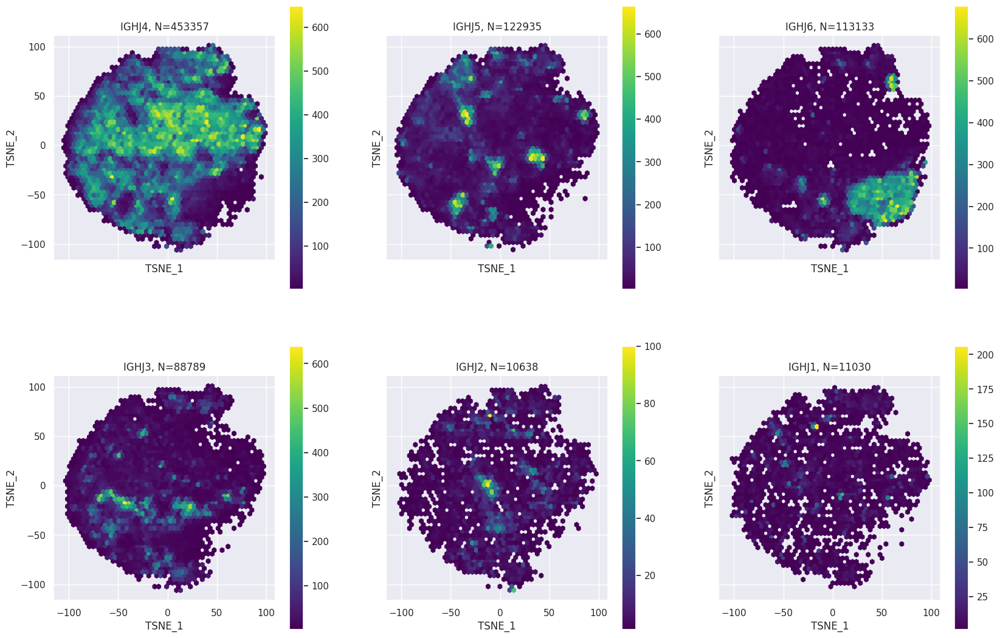

In [ ]:
gridsize = 50

# Get the unique classes
unique_classes = filtered_df[hue_name].unique()

# Calculate the number of rows and columns based on the number of unique classes
num_classes = len(unique_classes)
num_rows = int(num_classes**0.5)
num_cols = (num_classes + num_rows - 1) // num_rows

# Calculate the figure size to fit the square subplots and maintain the overall aspect ratio
fig_width = 20
fig_height = 20 * (num_rows / num_cols)

# Create a grid of subplots with equal aspect ratio
fig, axes = plt.subplots(num_rows, num_cols, figsize=(fig_width, fig_height), sharex=True, sharey=True)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through the unique classes and create hexbin plots with titles
for i, el in enumerate(unique_classes):
    ax = axes[i]
    x_data = filtered_df[filtered_df[hue_name] == el]['x']
    y_data = filtered_df[filtered_df[hue_name] == el]['y']

    # Set the aspect ratio to be equal (square)
    ax.set_aspect('equal')

    num_data_points = len(x_data)

    # Create a hexbin plot
    hb = ax.hexbin(x_data, y_data, gridsize=gridsize, mincnt=1, cmap='viridis')

    ax.set_title(f'{el}, N={num_data_points}')
    ax.set_xlabel(f'{red}_1', fontsize=12)
    ax.set_ylabel(f'{red}_2', fontsize=12)

    plt.colorbar(hb, ax=ax)  # Add colorbar

# Remove any empty subplots if the number of plots doesn't fill the grid
for i in range(num_classes, num_rows * num_cols):
    fig.delaxes(axes[i])

# Adjust layout to remove the gap between rows and columns
#plt.subplots_adjust(hspace=0, wspace=0)

# Display the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_hexbin_sep_by_{hue_name}.png')
plt.show()

In [ ]:
!zip -r /content/prott5.zip /content/prott5*

  adding: content/prott5_UMAP_H_CDR3_d_family.png (deflated 2%)
  adding: content/prott5_UMAP_H_CDR3_j_family.png (deflated 2%)
  adding: content/prott5_UMAP_H_CDR3_junction_length.png (deflated 2%)
  adding: content/prott5_UMAP_H_CDR3_log_pgen.png (deflated 1%)
  adding: content/prott5_UMAP_H_CDR3_v_family.png (deflated 2%)


## **Repertoires**

In [ ]:
print(len(filtered_df.repertoire_id.unique()))

count = filtered_df['repertoire_id'].value_counts()
print(count)

251
2892713941286916586-242ac113-0001-012    19389
2873730185838596586-242ac113-0001-012    16549
2918440795389956586-242ac113-0001-012    15293
3221665486487556586-242ac113-0001-012    15118
1047746754101308950-242ac113-0001-012    14875
                                         ...  
6084885090374324716-242ac114-0001-012        1
6054863268975284716-242ac114-0001-012        1
6078786236814004716-242ac114-0001-012        1
6066373781328564716-242ac114-0001-012        1
6067018026422964716-242ac114-0001-012        1
Name: repertoire_id, Length: 250, dtype: int64


TypeError: ignored

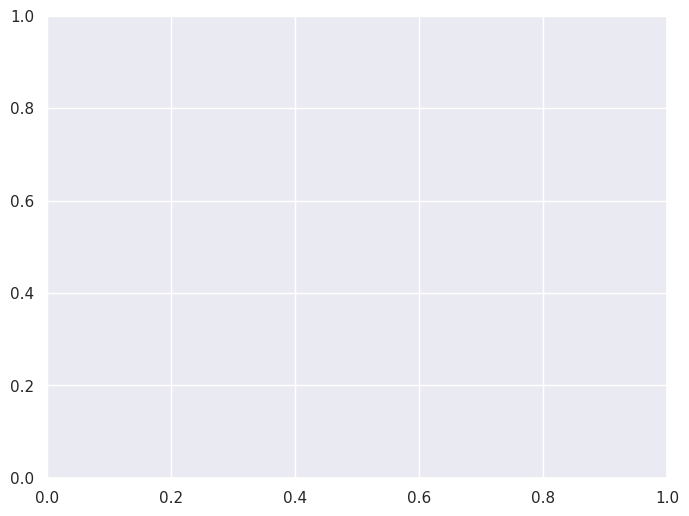

In [ ]:
label = 'repertoire_id'

data = filtered_df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
#plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

In [ ]:
print(count[0:16])

rep_ids = count[0:16].index

2892713941286916586-242ac113-0001-012    19389
2873730185838596586-242ac113-0001-012    16549
2918440795389956586-242ac113-0001-012    15293
3221665486487556586-242ac113-0001-012    15118
1047746754101308950-242ac113-0001-012    14875
1025069326778428950-242ac113-0001-012    14716
2804108765970436586-242ac113-0001-012    13953
2669762188951556586-242ac113-0001-012    13919
2644722529615876586-242ac113-0001-012    13424
2942020165844996586-242ac113-0001-012    13224
891281095508028950-242ac113-0001-012     12972
3203411875479556586-242ac113-0001-012    11635
1381079165943868950-242ac113-0001-012    11110
3046731468521476586-242ac113-0001-012    11038
3183182579515396586-242ac113-0001-012    10892
856577759756348950-242ac113-0001-012     10557
Name: repertoire_id, dtype: int64


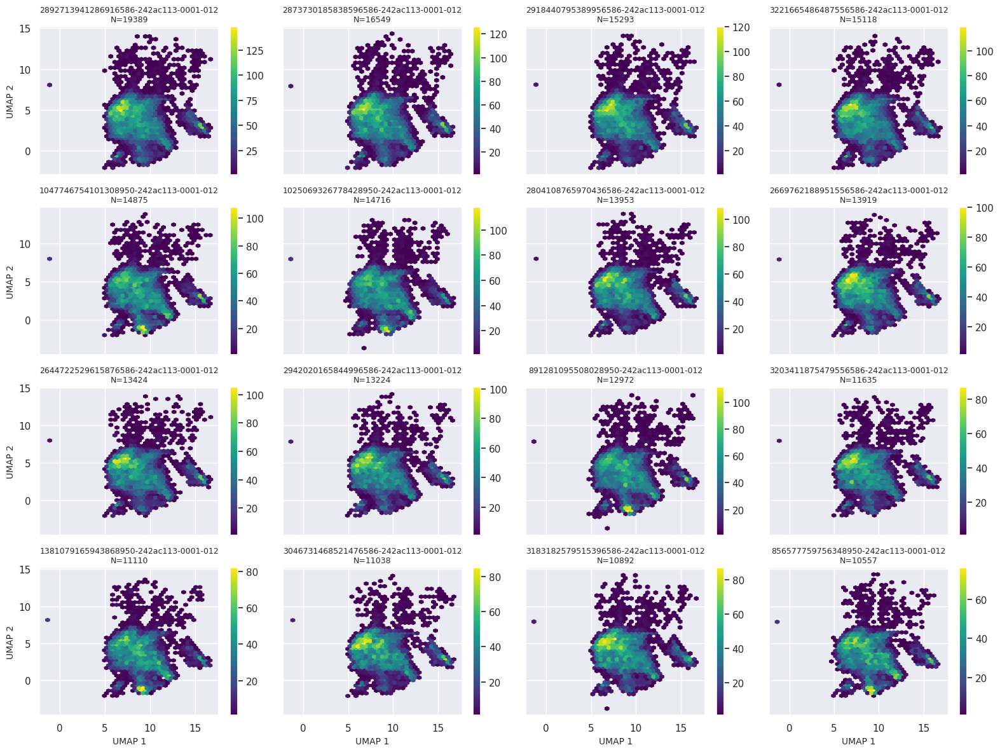

In [ ]:
label = 'repertoire_id'

x_dim = 4
y_dim = 4
gridsize = 40  # Adjust the gridsize as needed

fig, axes = plt.subplots(y_dim, x_dim, figsize=(16, 12), sharex='col', sharey='row')

c = 0

# Loop through the cutoff values and create hexbin plots
for i in range(y_dim):
    for j in range(x_dim):
        cutoff = rep_ids[c]
        c += 1

        ax = axes[i, j]
        x_data = filtered_df[filtered_df[label] == cutoff]['x']
        y_data = filtered_df[filtered_df[label] == cutoff]['y']

        hb = ax.hexbin(x_data, y_data, gridsize=gridsize, mincnt=1, cmap='viridis')
        num_data_points = len(x_data)
        ax.set_title(f'{rep_ids[c-1]}\nN={num_data_points}', fontsize=9)
        plt.colorbar(hb, ax=ax)  # Add colorbar

# Add labels to the axes
for i in range(x_dim):
    axes[x_dim-1, i].set_xlabel(f'{red} 1', fontsize=10)
    axes[i, 0].set_ylabel(f'{red} 2', fontsize=10)

# Adjust spacing between subplots
plt.tight_layout()

plt.savefig(f'{model_name}_{red}_{dataset_name}_sep_by_{label}.png')

# Show the plot
plt.show()

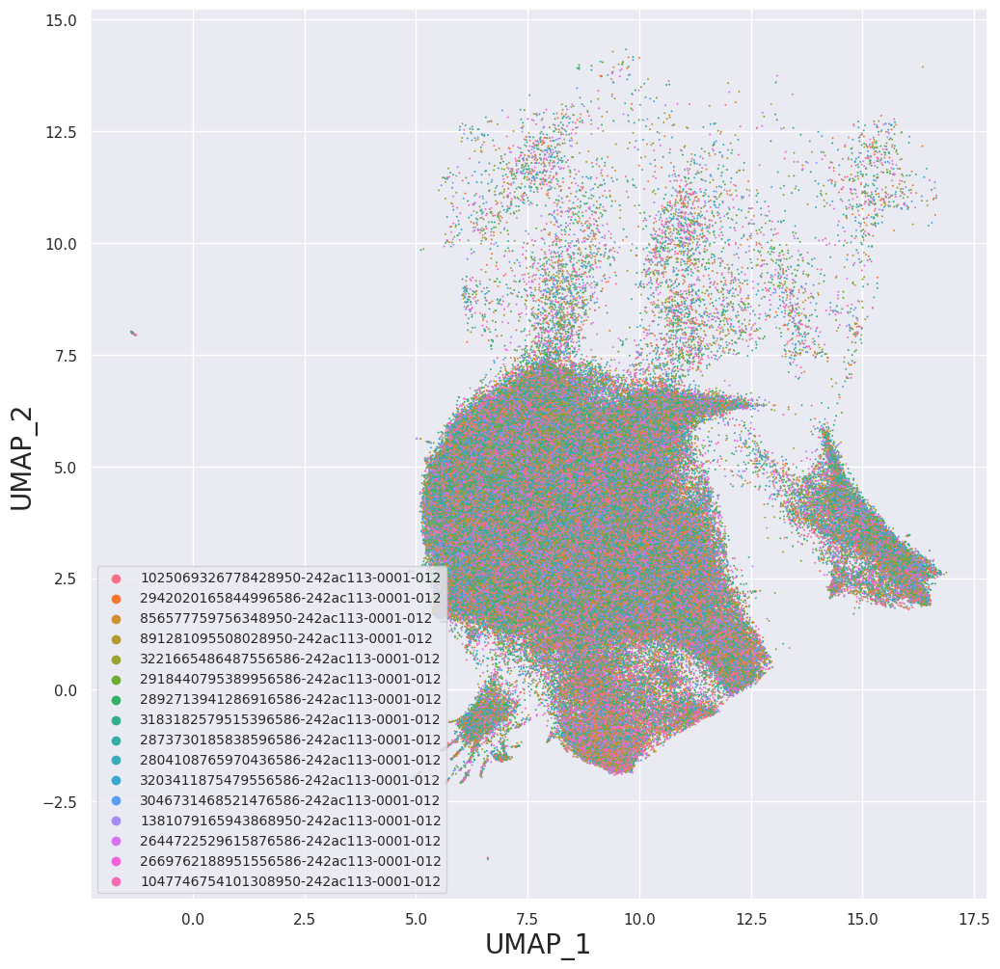

In [ ]:
# Define hue_name
hue_name = 'repertoire_id'

# Filter the DataFrame to include only the specified classes
filtered_df_filtered = filtered_df[filtered_df[hue_name].isin(rep_ids)]

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df_filtered, x='x', y='y', s=2, linewidth=0, hue=hue_name)

# Set the legend
plt.legend(loc='lower left', fontsize='small')

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}.png')
plt.show()

## **Covabadab**

In [ ]:
filtered_df[filtered_df['dataset'] == 'covabdab']['Protein + Epitope'].unique()

array(['S; RBD', 'S; non-RBD', 'S; NTD', 'S; S2 Stem Helix', 'S; S2',
       'S; NTD-SD1', 'Nsp9', "S; S2' Cleavage Site/Fusion Peptide NTD",
       'S; SD1', 'S; S1 non-RBD', 'S; S2 Fusion Peptide', 'S; Stem Helix',
       'S; Unk', 'N; NTD', 'M', 'S; probably RBD (implied by clustering)',
       'CSP ', nan, 'Unknown', 'S; S2 (quaternary glycan epitope)',
       'S; RBD/non-RBD', 'S; S1/S2 Cleavage Site', 'N', 'S', 'S; S1/S2',
       'E', 'S; S1', 'S; Possibly RBD', 'Mpro', 'Nsp3; PLpro', 'N; RBD',
       'N; CTD', 'S; non-S1', 'TBC', 'S2 (quaternary glycan epitope)',
       'S: NTD', 'S: RBD', "S; S2' Cleavage Site/Fusion Peptide",
       'S1; non-RBD', 'S; RBD/NTD'], dtype=object)

In [ ]:
print(len(filtered_df[filtered_df['dataset'] == 'covabdab']['Protein + Epitope'].unique()))

count = filtered_df[filtered_df['dataset'] == 'covabdab']['Protein + Epitope'].value_counts()
print(count)

40
S; RBD                                     7593
S; Unk                                     2321
S; NTD                                      574
S; non-RBD                                  413
S; S2                                       287
N                                            48
S; S1 non-RBD                                42
S; non-S1                                    33
S; Possibly RBD                              31
S; S1                                        26
Unknown                                      13
S1; non-RBD                                  11
S; S2 Stem Helix                              9
S; RBD/non-RBD                                8
S; S2 Fusion Peptide                          7
S; S2' Cleavage Site/Fusion Peptide NTD       6
N; NTD                                        6
S; Stem Helix                                 3
Nsp3; PLpro                                   3
M                                             3
N; RBD                               

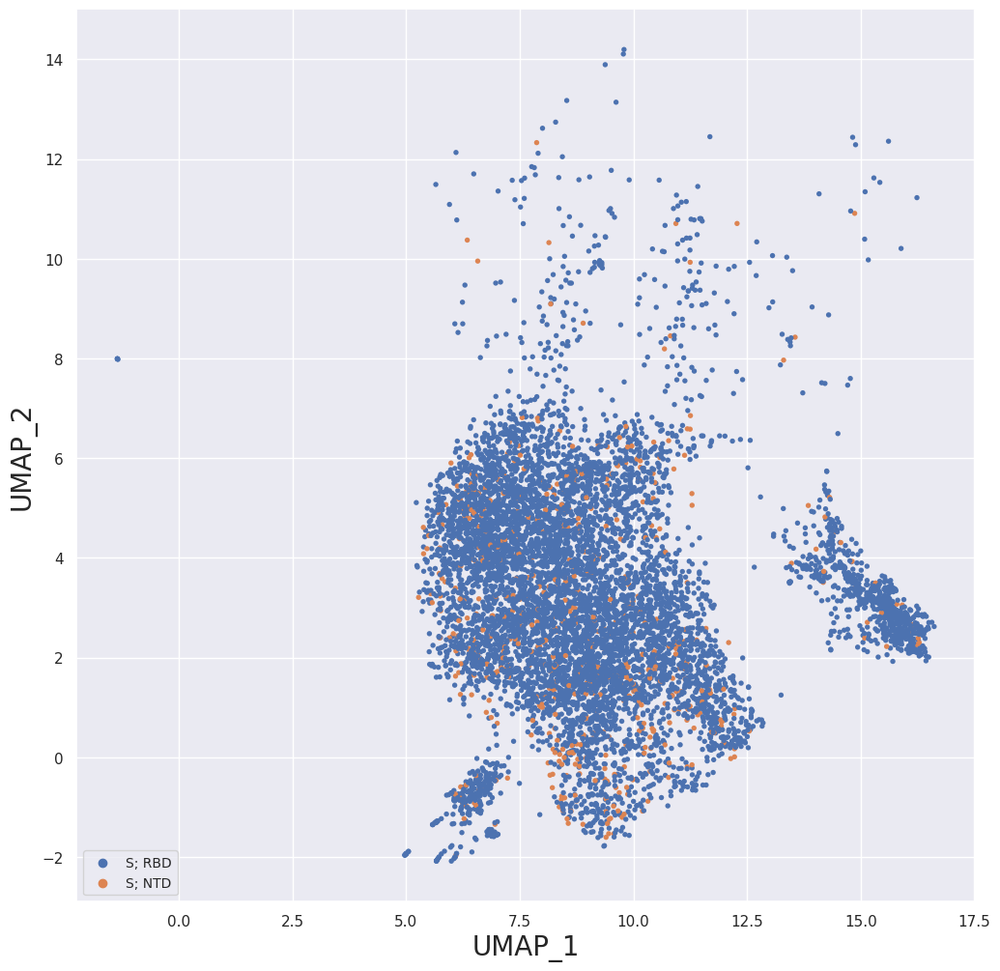

In [ ]:
rep_ids = ['S; NTD', 'S; RBD']

# Define hue_name
hue_name = 'Protein + Epitope'

# Filter the DataFrame to include only the specified classes
filtered_df_filtered = filtered_df[filtered_df[hue_name].isin(rep_ids)]

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df_filtered, x='x', y='y', s=15, linewidth=0, hue=hue_name)

# Set the legend
plt.legend(loc='lower left', fontsize='small')

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}.png')
plt.show()

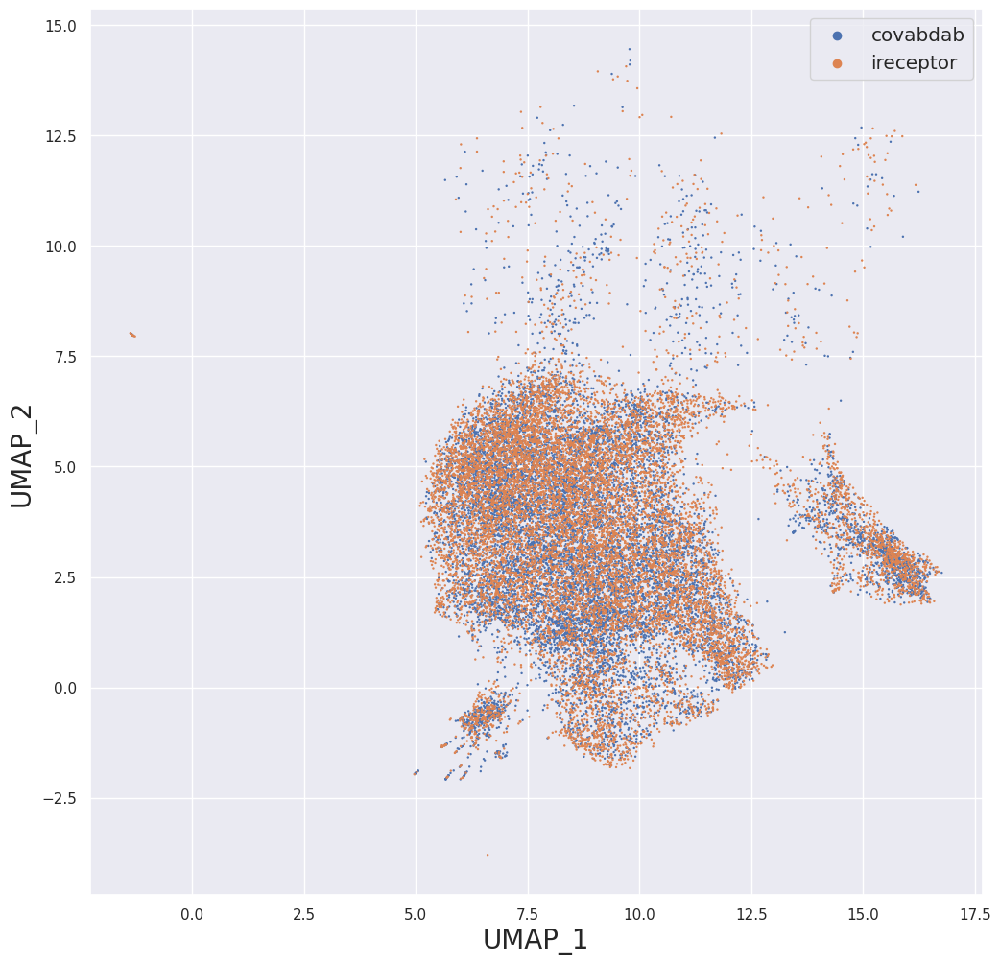

In [ ]:
# Define hue_name
hue_name = 'dataset'

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df[(filtered_df['dataset'] != 'trastuzumab')].head(24000), x='x', y='y', s=3, linewidth=0, hue=hue_name)

# Set the legend
plt.legend(loc='upper right', bbox_to_anchor=(1, 1), fontsize='large')

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}.png')
plt.show()

## **Trastuzumab**

In [ ]:
filtered_df['affinity'] = filtered_df['affinity'].fillna('lb')

array(['lb', 'hb', 'mb'], dtype=object)

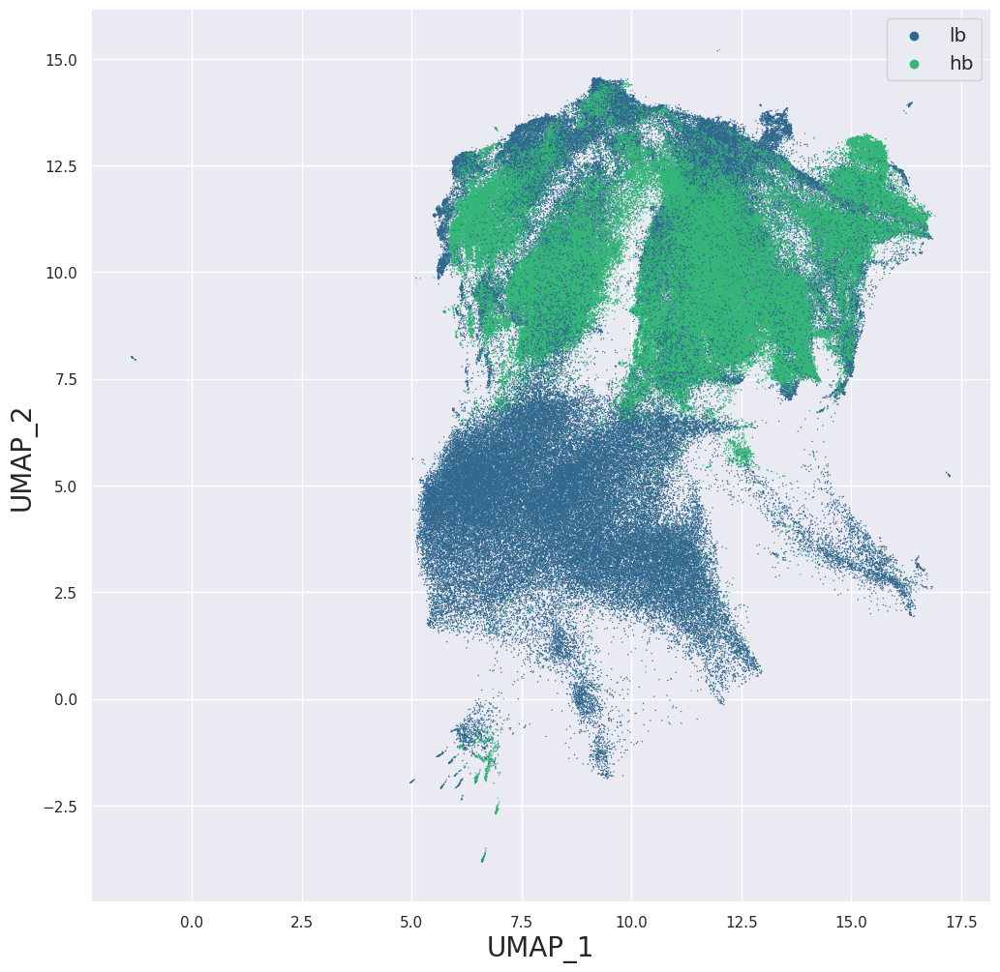

In [ ]:
# Define hue_name
hue_name = 'affinity'

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df[(filtered_df['junction_length'] == 15) & (filtered_df['dataset'] != 'covabdab') & (filtered_df['affinity'] != 'mb')], x='x', y='y', s=1, linewidth=0, hue=hue_name, palette='viridis')

# Set the legend
plt.legend(loc='upper right', bbox_to_anchor=(1, 1), fontsize='large')

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}_15.png')
plt.show()

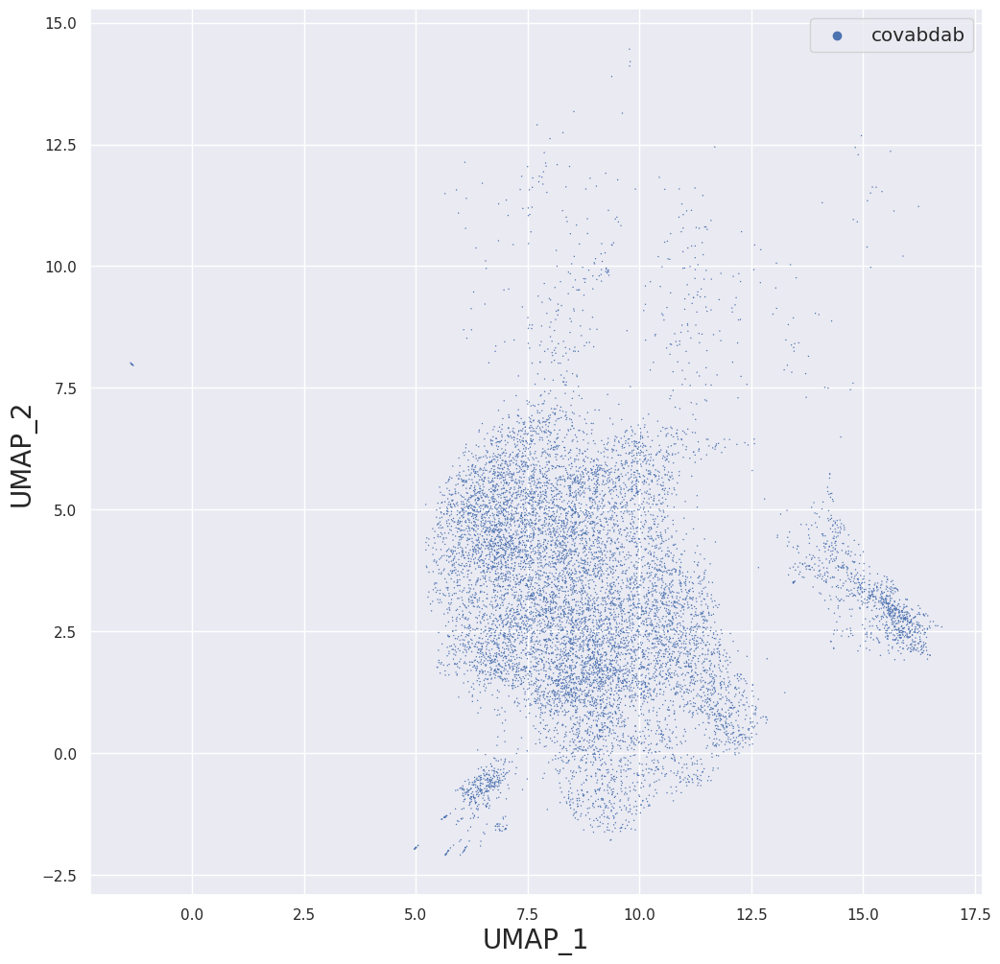

In [ ]:
# Define hue_name
hue_name = 'dataset'

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df[(filtered_df['dataset'] == 'covabdab')], x='x', y='y', s=1, linewidth=0, hue=hue_name)

# Set the legend
plt.legend(loc='upper right', bbox_to_anchor=(1, 1), fontsize='large')

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}_covabdab.png')
plt.show()

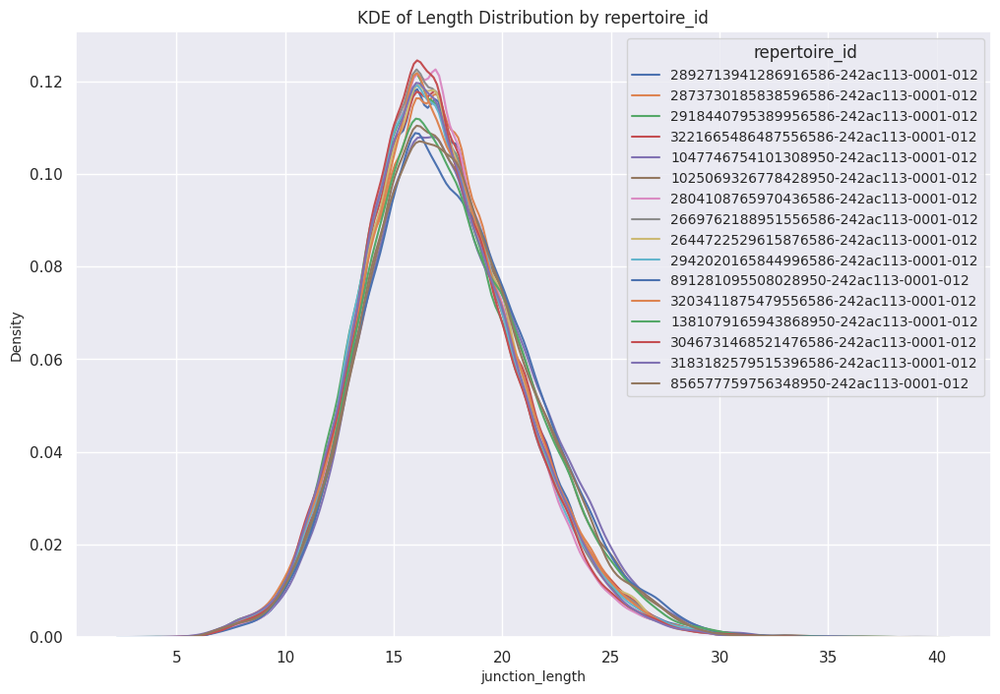

In [ ]:
# Define hue_name
hue_name = 'repertoire_id'
label = 'junction_length'

# Create a figure for the combined KDE plots
plt.figure(figsize=(12, 8))

# Loop through the cutoff values and create KDE plots
for cutoff in rep_ids:
    data = filtered_df[filtered_df[hue_name] == cutoff][label]

    sns.kdeplot(data, label=f'{cutoff}')

# Add labels and a legend
plt.xlabel('junction_length', fontsize=10)
plt.ylabel('Density', fontsize=10)
plt.title(f'KDE of Length Distribution by {hue_name}', fontsize=12)
plt.legend(title=hue_name, loc='upper right', fontsize='small')

# Save and show the plot
plt.savefig(f'{model_name}_{dataset_name}_kde_length_distr_by_{hue_name}.png')
plt.show()

# **Interactive length plots**

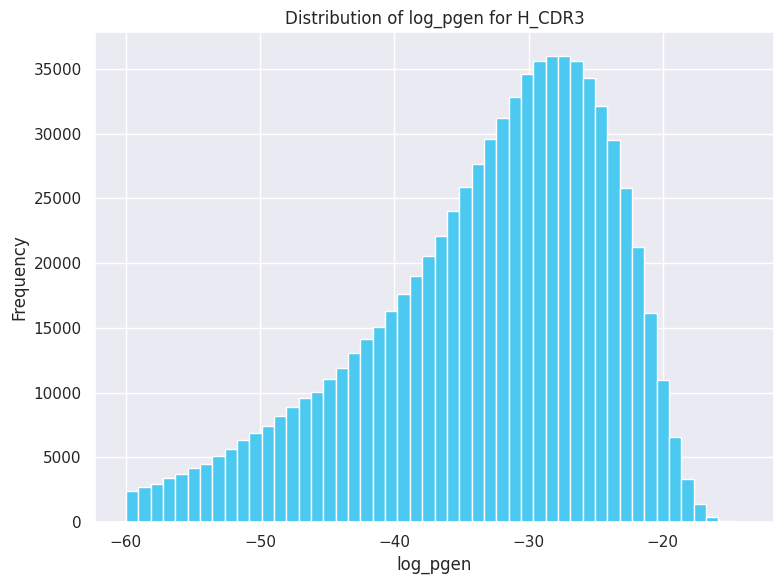

Max:  -14.017096638858614
Min:  -59.99997348303131


In [ ]:
label = 'log_pgen'

data = filtered_df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

print('Max: ', filtered_df[label].max())
print('Min: ', filtered_df[label].min())

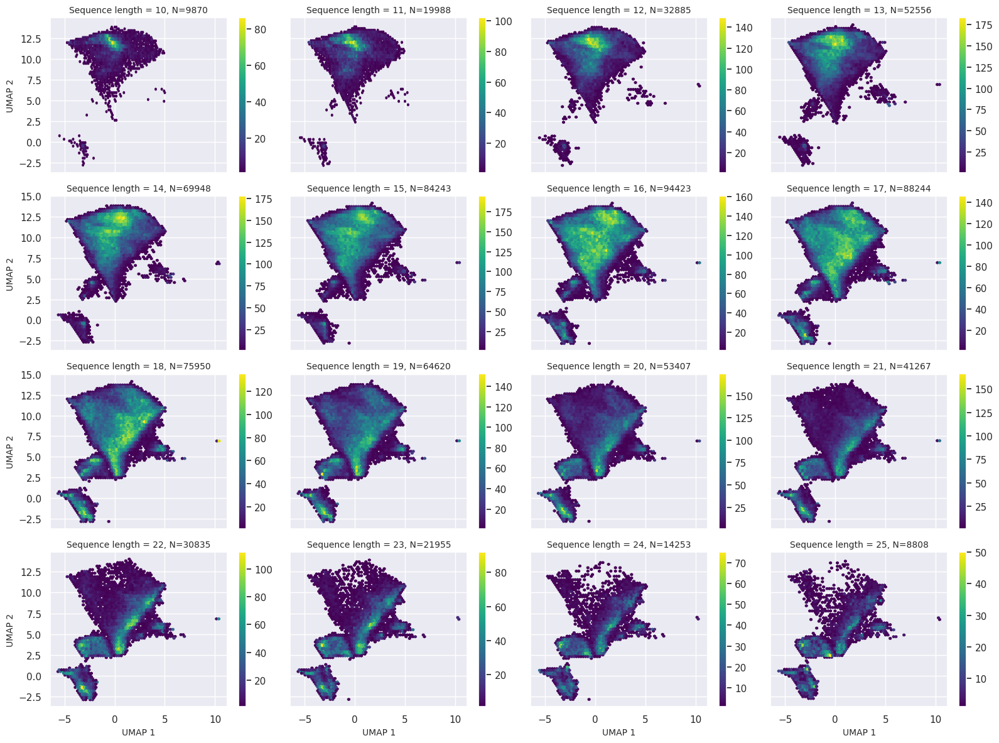

In [ ]:
cutoff_values = np.arange(10, 26, 1)
label = 'junction_length'

x_dim = 4
y_dim = 4
alpha = 0.05
gridsize = 70  # Adjust the gridsize as needed

fig, axes = plt.subplots(y_dim, x_dim, figsize=(16, 12), sharex='col', sharey='row')

c = 0

# Loop through the cutoff values and create hexbin plots
for i in range(y_dim):
    for j in range(x_dim):
        cutoff = cutoff_values[c]
        c += 1

        ax = axes[i, j]
        x_data = filtered_df[filtered_df[label] == cutoff]['x']
        y_data = filtered_df[filtered_df[label] == cutoff]['y']

        hb = ax.hexbin(x_data, y_data, gridsize=gridsize, mincnt=1, cmap='viridis')
        num_data_points = len(x_data)
        ax.set_title(f'Sequence length = {cutoff}, N={num_data_points}', fontsize=10)
        plt.colorbar(hb, ax=ax)  # Add colorbar

# Add labels to the axes
for i in range(x_dim):
    axes[x_dim-1, i].set_xlabel('UMAP 1', fontsize=10)
    axes[i, 0].set_ylabel('UMAP 2', fontsize=10)

# Adjust spacing between subplots
plt.tight_layout()

plt.savefig(f'{model_name}_{label}_{dataset_name}_hexbin.png')

# Show the plot
plt.show()

## **Divide by one label and color by another one**

In [ ]:
new_filtered_df = filtered_df[(filtered_df['log_pgen'] >= -60)]

In [ ]:
cutoff_values = np.arange(10, 26, 1)
len(cutoff_values)

16

<ipython-input-170-dd452d279bd0>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  original_cmap = cm.get_cmap(cmap_name)


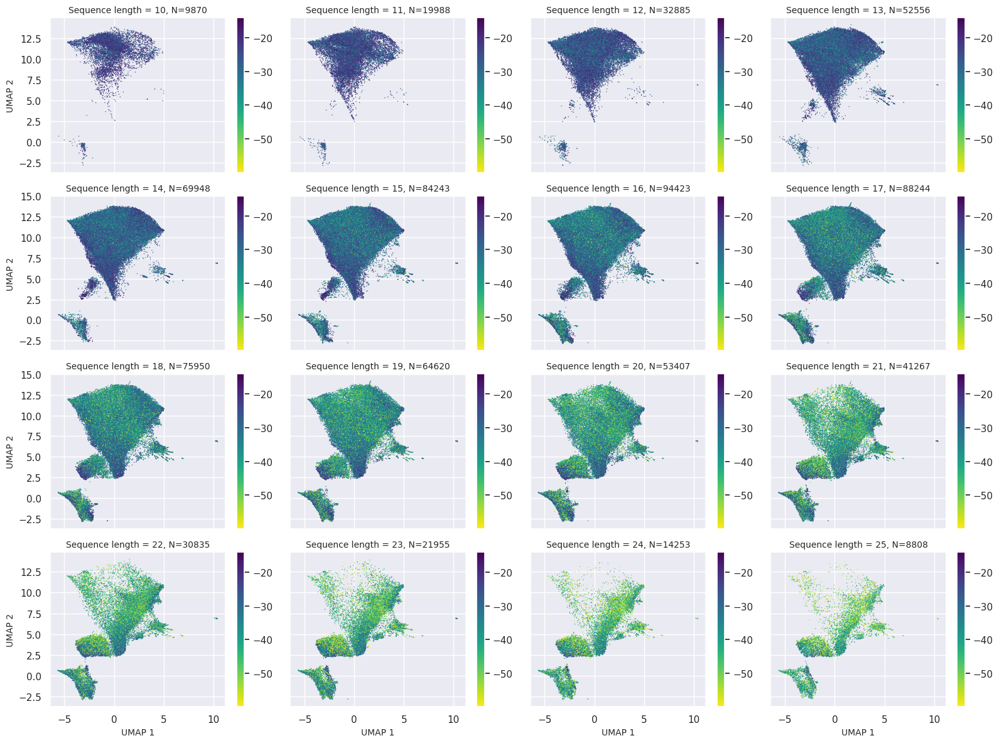

In [ ]:
label = 'junction_length'
hue_name = 'log_pgen'
cmap_name = 'viridis'

original_cmap = cm.get_cmap(cmap_name)

# Reverse the colormap
reversed_cmap = mcolors.ListedColormap(original_cmap.colors[::-1])

x_dim = 4
y_dim = 4

fig, axes = plt.subplots(y_dim, x_dim, figsize=(16, 12), sharex='col', sharey='row')

c = 0

# Calculate the overall min and max values for 'log_pgen' in filtered_df
global_min_log_pgen = new_filtered_df[hue_name].min()
global_max_log_pgen = new_filtered_df[hue_name].max()

# Create a consistent normalization object for the global color scale
norm = plt.Normalize(vmin=global_min_log_pgen, vmax=global_max_log_pgen)

# Create a single colorbar using the consistent normalization
sm = cm.ScalarMappable(cmap=reversed_cmap, norm=norm)
sm.set_array([])

# Loop through the cutoff values and create scatter plots
for i in range(y_dim):
    for j in range(x_dim):
        cutoff = cutoff_values[c]
        c += 1

        ax = axes[i, j]

        # Filter the data based on the 'junction_length' value
        subset = new_filtered_df[new_filtered_df[label] == cutoff]

        # Create the scatterplot
        scatter = sns.scatterplot(data=subset, x='x', y='y', s=1, linewidth=0, c=subset[hue_name], cmap=reversed_cmap, ax=ax, norm=norm)

        num_data_points = len(subset)
        ax.set_title(f'Sequence length = {cutoff}, N={num_data_points}', fontsize=10)

        # Add the consistent colorbar for 'hue_name'
        cbar = plt.colorbar(sm, label='', ax=ax)

        # Add a legend to the plot
        ax.legend().remove()

# Add labels to the axes
for i in range(x_dim):
    axes[x_dim-1, i].set_xlabel('UMAP 1', fontsize=10)
for i in range(y_dim):
    axes[i, 0].set_ylabel('UMAP 2', fontsize=10)

# Adjust spacing between subplots
plt.tight_layout()

# Add a single legend for the entire plot
#handles, labels = scatter.get_legend_handles_labels()
#fig.legend(handles, labels, loc='center right', title=hue_name)

plt.savefig(f'{model_name}_sep_{label}_col_{hue_name}_{dataset_name}_scatter.png')

# Show the plot
plt.show()


## **Plots for continuous values**

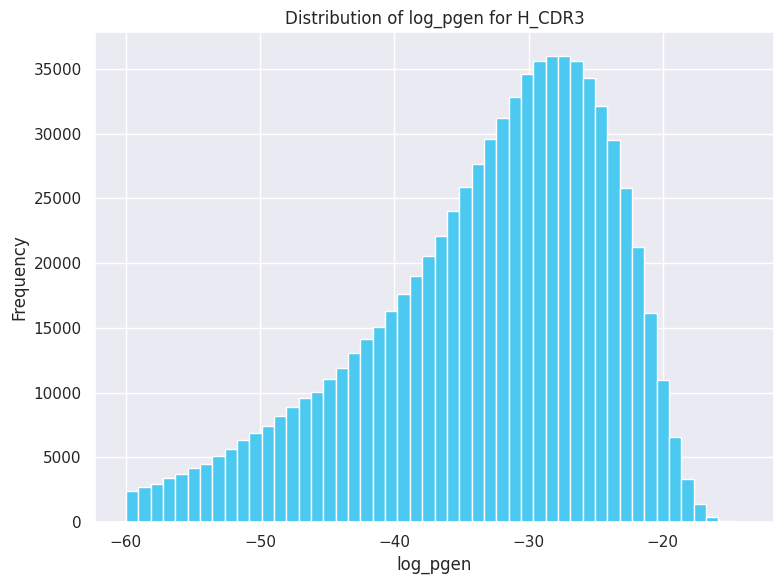

Max:  -14.017096638858614
Min:  -59.99997348303131


In [ ]:
label = 'log_pgen'

data = filtered_df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

print('Max: ', filtered_df[label].max())
print('Min: ', filtered_df[label].min())

In [ ]:
# Calculate the bins for junction lengths with a bin width of bin_width
bin_width = 3
filtered_df['log_pgen_bin'] = (filtered_df['log_pgen'] // bin_width) * bin_width
filtered_df['log_pgen_bin'] = filtered_df['log_pgen_bin'].astype(int)

In [ ]:
len(filtered_df['log_pgen_bin'].unique())

16

In [ ]:
np.sort(filtered_df['log_pgen_bin'].unique())

array([-60, -57, -54, -51, -48, -45, -42, -39, -36, -33, -30, -27, -24,
       -21, -18, -15])

In [ ]:
cutoff_values = np.arange(-15, -63, -3)
print(cutoff_values)
len(cutoff_values)

[-15 -18 -21 -24 -27 -30 -33 -36 -39 -42 -45 -48 -51 -54 -57 -60]


16

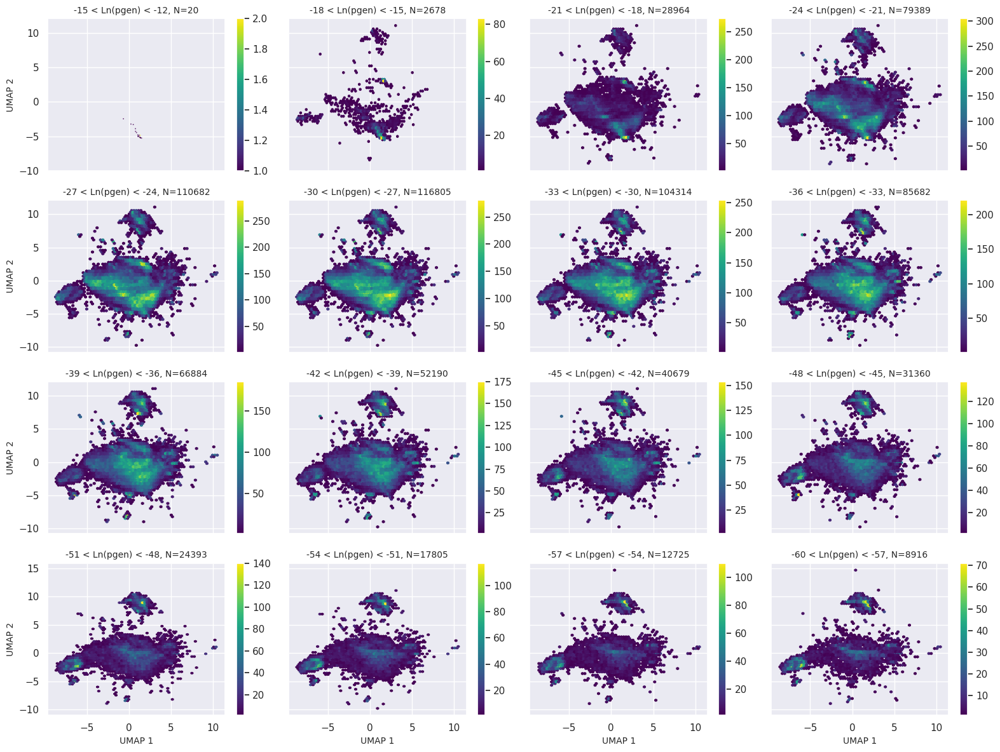

In [ ]:
label = 'log_pgen_bin'

x_dim = 4
y_dim = 4
alpha = 0.05
gridsize = 70  # Adjust the gridsize as needed

fig, axes = plt.subplots(y_dim, x_dim, figsize=(16, 12), sharex='col', sharey='row')

c = 0

# Loop through the cutoff values and create hexbin plots
for i in range(y_dim):
    for j in range(x_dim):
        cutoff = cutoff_values[c]
        c += 1

        ax = axes[i, j]
        x_data = filtered_df[filtered_df[label] == cutoff]['x']
        y_data = filtered_df[filtered_df[label] == cutoff]['y']

        hb = ax.hexbin(x_data, y_data, gridsize=gridsize, mincnt=1, cmap='viridis')
        num_data_points = len(x_data)
        ax.set_title(f'{cutoff} < Ln(pgen) < {cutoff+3}, N={num_data_points}', fontsize=10)
        plt.colorbar(hb, ax=ax)  # Add colorbar

# Add labels to the axes
for i in range(x_dim):
    axes[x_dim-1, i].set_xlabel('UMAP 1', fontsize=10)
for i in range(y_dim):
    axes[i, 0].set_ylabel('UMAP 2', fontsize=10)

# Adjust spacing between subplots
plt.tight_layout()

plt.savefig(f'{model_name}_{label}_{dataset_name}_hexbin.png')

# Show the plot
plt.show()

# **Random sequences generation and analysis**

In [ ]:
df = pd.read_csv(f'drive/MyDrive/Oslo/data/paper/FASTA/combined_cdr3_heavy.csv', sep=';')
df['junction_length'] = df['seq'].apply(len)

filtered_df = df[(df['junction_length'] <= 15)]

# Remove duplicates based on the 'junction_aa' column
filtered_df = filtered_df.drop_duplicates(subset='seq', keep='first')

filtered_df

,index,seq,junction_length
0,1,ASGAVTDFVY,10
1,2,AKEGPLYSSGYYFDY,15
2,3,TTDRTHYYDSFY,12
3,4,SHQIDYHYRMDF,12
5,6,ARDAMTTIPRFDS,13
...,...,...,...
794606,794607,ARDLNGGYGGGYFDC,15
794607,794608,DVSYFDSPGYYYFDY,15
794615,794616,VKDLYSGRFYYFLDD,15
794618,794619,VLLTVLTPDDAFDI,14


In [ ]:
from collections import Counter
import random


# Create a dictionary to store amino acid probs for each length
amino_acid_frequencies = {}

# Get the unique junction lengths
unique_lengths = filtered_df["junction_length"].unique()

# Iterate through unique junction lengths and calculate amino acid frequencies
for length in unique_lengths:
    sequences = filtered_df[filtered_df["junction_length"] == length]["seq"]
    position_probabilities = []  # Use probabilities instead of frequencies

    for i in range(length):
        amino_acids = [seq[i] for seq in sequences]
        amino_acid_frequency = dict(Counter(amino_acids))
        total_counts = sum(amino_acid_frequency.values())
        amino_acid_probabilities = {aa: count / total_counts for aa, count in amino_acid_frequency.items()}
        position_probabilities.append(amino_acid_probabilities)

    amino_acid_frequencies[length] = position_probabilities  # Store probabilities instead of frequencies

# Create a list to store the generated random sequences
random_sequences = []

# Create a list to store sequences for the CSV file
csv_data = []

# Iterate through each sequence in filtered_df
for index, row in filtered_df.iterrows():
    junction_length = row["junction_length"]
    probabilities = amino_acid_frequencies[junction_length]

    random_sequence = ""
    for i in range(junction_length):
        amino_acids = list(probabilities[i].keys())
        probabilities_list = list(probabilities[i].values())
        random_aa = random.choices(amino_acids, probabilities_list)[0]
        random_sequence += random_aa

    random_sequences.append(random_sequence)
    csv_data.append({"id": index, "seq": random_sequence})



# Save the generated random sequences as a FASTA file
with open("random_aa_matrix_L_CDR3.fa", "w") as fasta_file:
    for i, sequence in enumerate(random_sequences):
        header = f">{i + 1}"
        fasta_file.write(f"{header}\n{sequence}\n")

# Save the random sequences as a CSV file
csv_df = pd.DataFrame(csv_data)
csv_df.to_csv("random_aa_matrix_L_CDR3.csv", index=False, sep=';')

KeyboardInterrupt: ignored

In [ ]:
# check

df1 = pd.read_csv(f'drive/MyDrive/Oslo/data/paper/FASTA/combined_cdr3_heavy.csv', sep=';')
df1 = df1.rename(columns={'seq': 'junction_aa'})
df1['junction_length'] = df1['junction_aa'].apply(len)
df1 = df1[(df1['junction_length'] <= 40)]


df2 = pd.read_csv('drive/MyDrive/Oslo/data/paper/FASTA/random_aa_matrix_H_CDR3.csv', sep=';')
df2 = df2.rename(columns={'seq': 'junction_aa'})
df2['junction_length'] = df2['junction_aa'].apply(len)
df2 = df2[(df2['junction_length'] <= 40)]


df3 = pd.read_csv('drive/MyDrive/Oslo/data/ireceptor/H_CDR3.csv', sep=';')
df3 = df3.drop('junction_aa', axis=1)
df3 = df3.rename(columns={'cdr3_aa': 'junction_aa'})
df3['junction_length'] = df3['junction_aa'].apply(len)
df3 = df3[(df3['junction_length'] <= 40)]


# Function to calculate amino acid frequencies
def calculate_aa_frequencies(df):
    amino_acid_frequencies = {}
    unique_lengths = df["junction_length"].unique()

    for length in unique_lengths:
        sequences = df[df["junction_length"] == length]["junction_aa"]
        position_frequencies = []

        for i in range(length):
            amino_acids = [seq[i] for seq in sequences]
            amino_acid_frequency = dict(Counter(amino_acids))

            # Sort the amino acid keys for consistent order
            sorted_frequency = {aa: amino_acid_frequency[aa] for aa in sorted(amino_acid_frequency.keys())}

            total_counts = sum(sorted_frequency.values())
            amino_acid_probabilities = {aa: count / total_counts for aa, count in sorted_frequency.items()}
            position_frequencies.append(amino_acid_probabilities)

        amino_acid_frequencies[length] = position_frequencies

    return amino_acid_frequencies

# Calculate amino acid frequencies for each dataframe
amino_acid_frequencies_df1 = calculate_aa_frequencies(df1)
amino_acid_frequencies_df2 = calculate_aa_frequencies(df2)
amino_acid_frequencies_df3 = calculate_aa_frequencies(df3)

# Compare the amino acid frequencies
for length in amino_acid_frequencies_df1.keys():
    for i in range(len(amino_acid_frequencies_df1[length])):
        frequencies1 = amino_acid_frequencies_df1[length][i]
        frequencies2 = amino_acid_frequencies_df2[length][i]
        frequencies3 = amino_acid_frequencies_df3[length][i]

        # Compare the frequencies for the two dataframes
        # You can define a similarity measure based on your specific criteria
        # Here, we're simply printing the results for illustration
        print(f"Sequence Length: {length}, Position {i}:")
        print("DataFrame 1 Frequencies:", frequencies1)
        print("DataFrame 2 Frequencies:", frequencies2)
        print("DataFrame 3 Frequencies:", frequencies3)
        print()

Sequence Length: 10, Position 0:
DataFrame 1 Frequencies: {'A': 0.8111830163365165, 'C': 0.000986504616841607, 'D': 0.00015784073869465709, 'E': 0.0009075842474942782, 'F': 0.0011838055402099282, 'G': 0.014047825743824481, 'H': 0.0005524425854312998, 'I': 0.003906558282692763, 'K': 0.00019730092336832136, 'L': 0.003196274958566806, 'M': 0.0013416462789045853, 'N': 0.0016178675716202351, 'P': 0.00039460184673664273, 'Q': 0.0007497435087996212, 'R': 0.002288690711072528, 'S': 0.013889985005129824, 'T': 0.07047588982716439, 'V': 0.07126509352063767, 'W': 0.0006313629547786283, 'Y': 0.0010259648015152711}
DataFrame 2 Frequencies: {'A': 0.8159182384973561, 'C': 0.0009075842474942782, 'D': 0.00011838055402099282, 'E': 0.000868124062820614, 'F': 0.0010259648015152711, 'G': 0.013495383158393182, 'H': 0.0008286638781469497, 'I': 0.004182779575408413, 'K': 0.00015784073869465709, 'L': 0.003038434219872149, 'M': 0.0013811064635782496, 'N': 0.0020519296030305422, 'P': 0.0002762212927156499, 'Q': 0

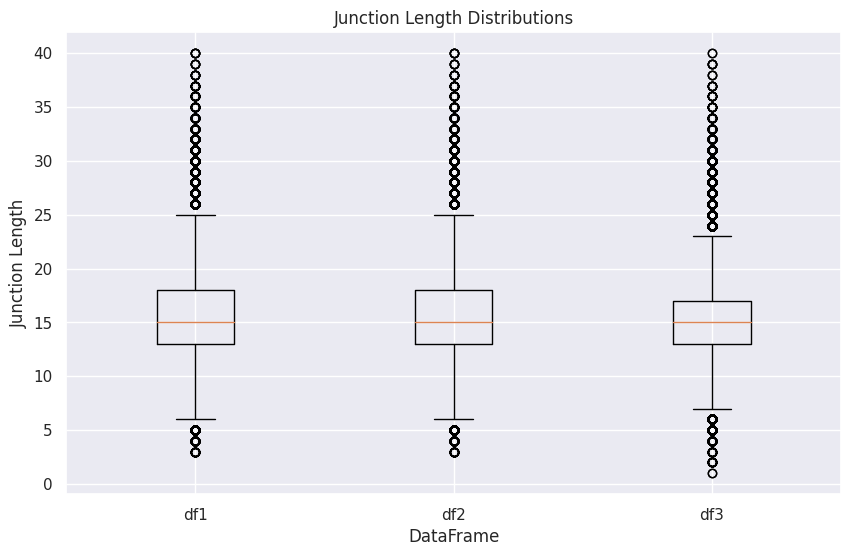

In [ ]:
# Extract the 'junction_length' column from each DataFrame
junction_length_df1 = df1['junction_length']
junction_length_df2 = df2['junction_length']
junction_length_df3 = df3['junction_length']

# Create a list of the extracted columns
data = [junction_length_df1, junction_length_df2, junction_length_df3]

# Create a labels list to identify each dataset
labels = ['df1', 'df2', 'df3']

# Create a boxplot to compare the distributions
plt.figure(figsize=(10, 6))
plt.boxplot(data, labels=labels)
plt.title('Junction Length Distributions')
plt.xlabel('DataFrame')
plt.ylabel('Junction Length')
plt.show()

In [ ]:
# Define a function to calculate Euclidean distance between two probability vectors
def euclidean_distance(vector1, vector2):
    return np.linalg.norm(vector1 - vector2)

# Calculate amino acid frequencies for each dataframe
amino_acid_frequencies_df1 = calculate_aa_frequencies(df1)
amino_acid_frequencies_df2 = calculate_aa_frequencies(df2)
amino_acid_frequencies_df3 = calculate_aa_frequencies(df3)

# Initialize lists to store the distances
distances_1_2 = []
distances_1_3 = []
distances_2_3 = []

# Compare the amino acid frequencies
for length in amino_acid_frequencies_df1.keys():
    for i in range(len(amino_acid_frequencies_df1[length])):
        frequencies1 = list(amino_acid_frequencies_df1[length][i].values())
        frequencies2 = list(amino_acid_frequencies_df2[length][i].values())
        frequencies3 = list(amino_acid_frequencies_df3[length][i].values())

        # Ensure that all vectors have the same dimension by padding with zeros
        max_dimension = max(len(frequencies1), len(frequencies2), len(frequencies3))
        frequencies1 += [0] * (max_dimension - len(frequencies1))
        frequencies2 += [0] * (max_dimension - len(frequencies2))
        frequencies3 += [0] * (max_dimension - len(frequencies3))

        # Calculate the Euclidean distances between the probability vectors
        distance_1_2 = euclidean_distance(np.array(frequencies1), np.array(frequencies2))
        distance_1_3 = euclidean_distance(np.array(frequencies1), np.array(frequencies3))
        distance_2_3 = euclidean_distance(np.array(frequencies2), np.array(frequencies3))

        distances_1_2.append(distance_1_2)
        distances_1_3.append(distance_1_3)
        distances_2_3.append(distance_2_3)

# Calculate the mean distances for each combination
mean_distance_1_2 = np.mean(distances_1_2)
mean_distance_1_3 = np.mean(distances_1_3)
mean_distance_2_3 = np.mean(distances_2_3)

# Display the mean distances
print("Mean Distance from DataFrame 1 to DataFrame 2:", mean_distance_1_2)
print("Mean Distance from DataFrame 1 to DataFrame 3:", mean_distance_1_3)
print("Mean Distance from DataFrame 2 to DataFrame 3:", mean_distance_2_3)

Mean Distance from DataFrame 1 to DataFrame 2: 0.17631802316815456
Mean Distance from DataFrame 1 to DataFrame 3: 0.250667318581895
Mean Distance from DataFrame 2 to DataFrame 3: 0.25424905849887536


In [ ]:
import random
import string

# Initialize an empty list to store the generated random sequences
random_sequences = []

# Generate random amino acid sequences of the same length as each sequence in the existing DataFrame
for _, row in df.iterrows():
    sequence_length = len(row['seq'])
    random_sequence = ''.join(random.choice('ACDEFGHIKLMNPQRSTVWY') for _ in range(sequence_length))
    random_sequences.append(random_sequence)

# Create a new DataFrame with the generated random sequences
random_df = pd.DataFrame({'seq': random_sequences})
random_df.to_csv(f'random_{chain}_{segment}.csv', sep=';', index=True)

# Add a column with seq lengths
random_df['seq_length'] = random_df['seq'].apply(len)

random_df

,seq,seq_length
0,MDKAHWNGLV,10
1,HMDYPSVMVFHEIIW,15
2,WMKYVTEGVRWP,12
3,GAYSMTILYSPA,12
4,MQHEDMQGFADTTGYATRDQ,20
...,...,...
794615,FGMGTLVKIAFPLKN,15
794616,ICQHEGELCPGKMYSN,16
794617,ACVYMYNSNDNLGQKVT,17
794618,PFWSLMRMEKFESP,14


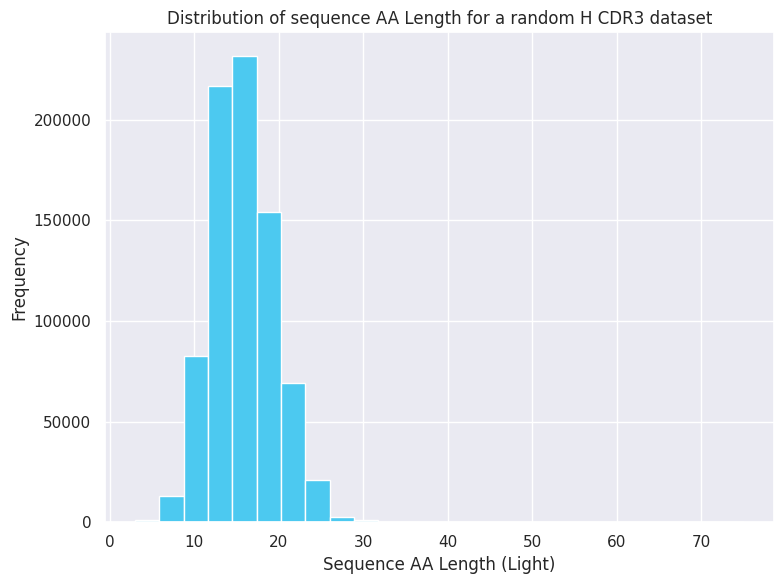

In [ ]:
# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(random_df['seq_length'], bins=25, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of sequence AA Length for a random {chain} {segment} dataset')
ax.set_xlabel('Sequence AA Length (Light)')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_sequence_AA_Length_random_{chain}_{segment}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

In [ ]:
with open(f'random_{chain}_{segment}.fa', 'w') as fasta_file:
    for idx, row in random_df.iterrows():
        sequence_identifier = f">{idx}"  # Create an identifier using the row index
        sequence = row['seq']
        fasta_file.write(f"{sequence_identifier}\n{sequence}\n")

# **Random sequences length plots**

In [ ]:
chain = 'H'
segment = 'CDR3'
model_name = 'prott5'
dataset_name = f'{chain}_{segment}'

In [ ]:
umap_df = pd.DataFrame(pd.read_pickle(f'drive/MyDrive/Oslo/output/{model_name}/UMAP_RANDOM_{dataset_name}.pkl').values)
umap_df.columns = ['x', 'y']
umap_df['id'] = range(1, len(umap_df) + 1)

metadata_df = pd.read_csv(f'drive/MyDrive/Oslo/data/random/random_{dataset_name}.csv', sep=';')
metadata_df['id'] = range(1, len(metadata_df) + 1)
metadata_df['seq_length'] = metadata_df['seq'].apply(len)
#merged_df = pd.merge(metadata_df, umap_df, right_index=True, left_index=True)
merged_df = pd.merge(metadata_df, umap_df, on='id')

merged_df

,index,seq,id,seq_length,x,y
0,0,MDKAHWNGLV,1,10,0.196873,-3.927869
1,1,HMDYPSVMVFHEIIW,2,15,0.969148,3.252939
2,2,WMKYVTEGVRWP,3,12,-1.195697,2.777725
3,3,GAYSMTILYSPA,4,12,0.269078,4.008606
4,4,MQHEDMQGFADTTGYATRDQ,5,20,2.086499,-4.375943
...,...,...,...,...,...,...
794615,794615,FGMGTLVKIAFPLKN,794616,15,1.677730,6.172611
794616,794616,ICQHEGELCPGKMYSN,794617,16,3.943135,0.587948
794617,794617,ACVYMYNSNDNLGQKVT,794618,17,1.551691,-0.805782
794618,794618,PFWSLMRMEKFESP,794619,14,-1.402779,2.458203


In [ ]:
if chain == 'L':
  filtered_df = merged_df[merged_df['seq_length'] <= 20]
else:
  filtered_df = merged_df[merged_df['seq_length'] <= 30]

filtered_df

,index,seq,id,seq_length,x,y
0,0,MDKAHWNGLV,1,10,0.196873,-3.927869
1,1,HMDYPSVMVFHEIIW,2,15,0.969148,3.252939
2,2,WMKYVTEGVRWP,3,12,-1.195697,2.777725
3,3,GAYSMTILYSPA,4,12,0.269078,4.008606
4,4,MQHEDMQGFADTTGYATRDQ,5,20,2.086499,-4.375943
...,...,...,...,...,...,...
794615,794615,FGMGTLVKIAFPLKN,794616,15,1.677730,6.172611
794616,794616,ICQHEGELCPGKMYSN,794617,16,3.943135,0.587948
794617,794617,ACVYMYNSNDNLGQKVT,794618,17,1.551691,-0.805782
794618,794618,PFWSLMRMEKFESP,794619,14,-1.402779,2.458203


<ipython-input-48-3c4b77c41038>:15: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, label=hue_name)


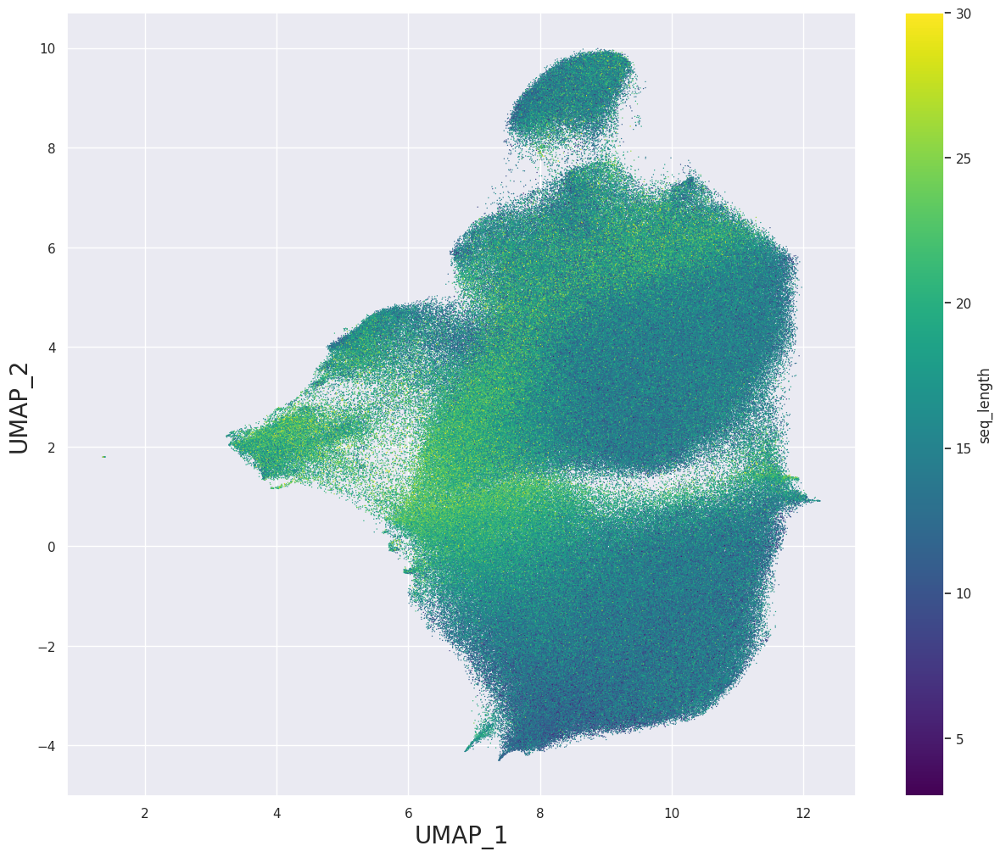

In [ ]:
import matplotlib.cm as cm

hue_name = 'seq_length'
cmap_name = 'viridis'

# Create the scatterplot
plt.figure(figsize=(15, 12))
scatter = sns.scatterplot(data=filtered_df, x='x', y='y', s=1, linewidth=0, c=filtered_df[hue_name], cmap=cmap_name)

# Create a ScalarMappable for the colorbar
sm = cm.ScalarMappable(cmap=cmap_name, norm=plt.Normalize(vmin=filtered_df[hue_name].min(), vmax=filtered_df[hue_name].max()))
sm.set_array([])  # You need to set an empty array for it to work

# Add a colorbar for 'mu_freq_heavy'
cbar = plt.colorbar(sm, label=hue_name)

# Set axes' names
plt.xlabel('UMAP_1', fontsize=20)
plt.ylabel('UMAP_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_UMAP_RANDOM_{dataset_name}_{hue_name}.png')
plt.show()

In [ ]:
if chain == 'L':
  length_df = filtered_df[(filtered_df['seq_length'] == 8)]
else:
  length_df = filtered_df[(filtered_df['seq_length'] == 15)]

length_df

,index,seq,id,seq_length,x,y
1,1,HMDYPSVMVFHEIIW,2,15,0.969148,3.252939
6,6,CQGTRATREKEASIF,7,15,-1.551983,-0.846021
9,9,CELILMAINPKNEWM,10,15,0.736831,1.960343
13,13,FGNFKICDGCMKEFY,14,15,5.417612,-0.069419
19,19,DMPRRHHMEHRAKPC,20,15,-0.413242,-1.746988
...,...,...,...,...,...,...
794597,794597,SNMMHIEWEDNFFCM,794598,15,-0.323323,1.618869
794604,794604,TSKLYYCMTGPGLHF,794605,15,0.583955,6.696239
794606,794606,SKCIGGITLDPGDST,794607,15,-1.031928,0.408527
794607,794607,MLVERWCGFREHHWG,794608,15,1.241613,-3.893241


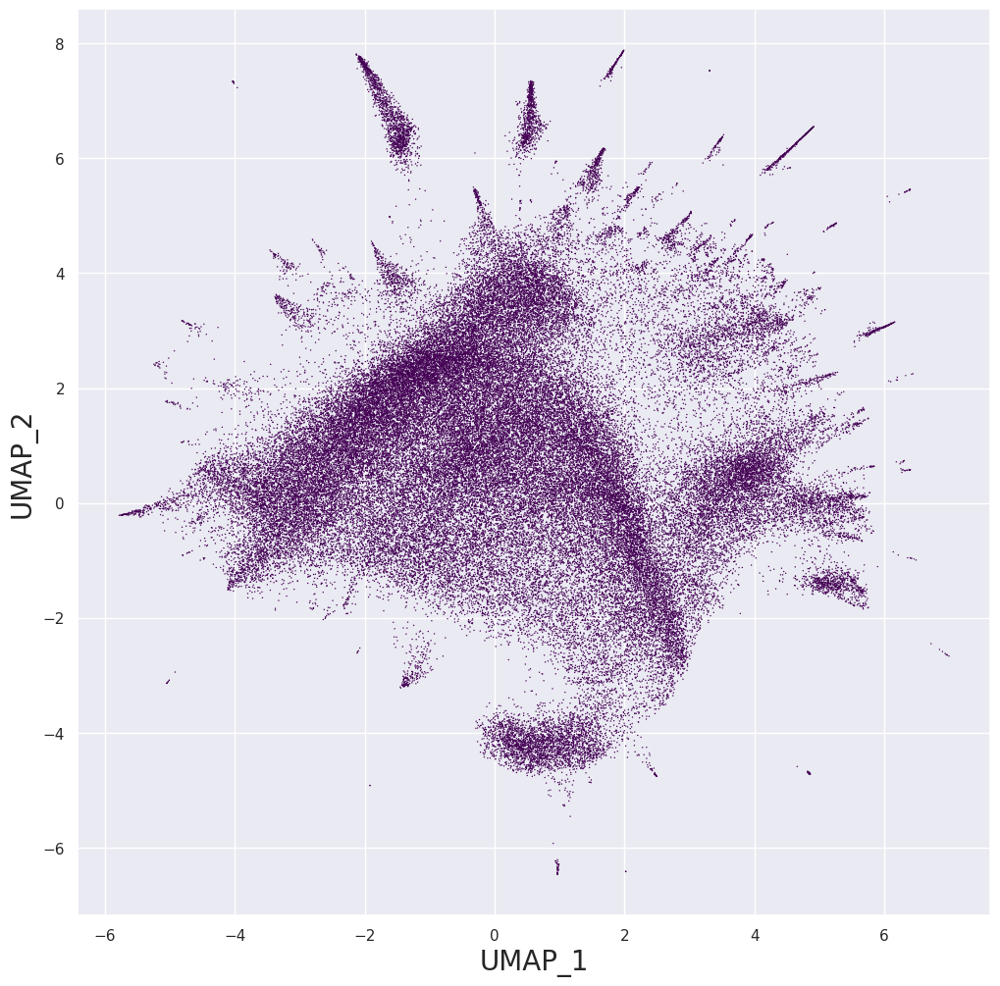

In [ ]:
import matplotlib.cm as cm

hue_name = 'seq_length'
cmap_name = 'viridis'

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=length_df, x='x', y='y', s=1, linewidth=0, c=length_df[hue_name], cmap=cmap_name)

# Create a ScalarMappable for the colorbar
sm = cm.ScalarMappable(cmap=cmap_name, norm=plt.Normalize(vmin=length_df[hue_name].min(), vmax=length_df[hue_name].max()))
sm.set_array([])  # You need to set an empty array for it to work

# Add a colorbar for 'mu_freq_heavy'
#cbar = plt.colorbar(sm, label=hue_name)

# Set axes' names
plt.xlabel('UMAP_1', fontsize=20)
plt.ylabel('UMAP_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_UMAP_RANDOM_len=15_{dataset_name}_{hue_name}.png')
plt.show()

In [ ]:
!zip -r /content/tsne.zip /content/*TSNE*

  adding: content/esm2_TSNE_H_CDR3_d_family.png (deflated 0%)
  adding: content/esm2_TSNE_H_CDR3_hexbin_sep_by_d_family.png (deflated 2%)
  adding: content/esm2_TSNE_H_CDR3_hexbin_sep_by_j_family.png (deflated 3%)
  adding: content/esm2_TSNE_H_CDR3_hexbin_sep_by_v_family.png (deflated 2%)
  adding: content/esm2_TSNE_H_CDR3_j_family.png (deflated 0%)
  adding: content/esm2_TSNE_H_CDR3_junction_length.png (deflated 0%)
  adding: content/esm2_TSNE_H_CDR3_log_pgen.png (deflated 0%)
  adding: content/esm2_TSNE_H_CDR3_sep_by_junction_length.png (deflated 1%)
  adding: content/esm2_TSNE_H_CDR3_v_family.png (deflated 0%)


# **TSNE and PCA plots for CDR3**

In [ ]:
!rm *

rm: cannot remove 'drive': Is a directory
rm: cannot remove 'sample_data': Is a directory


In [ ]:
model_name = 'esm2'
data = 'RANDOM_AA'
chain = 'L'
red = 'TSNE'

if data == 'RANDOM':
  df = pd.read_pickle(f'drive/MyDrive/Oslo/data/paper/output/{model_name}/{red}_RANDOM_{chain}_CDR3.pkl')
elif data == 'REAL':
  df = pd.read_pickle(f'drive/MyDrive/Oslo/data/paper/output/{model_name}/{red}_{chain}_CDR3.pkl')
elif data == 'RANDOM_AA':
  df = pd.read_pickle(f'drive/MyDrive/Oslo/data/paper/output/{model_name}/{red}_random_aa_matrix_{chain}_CDR3.pkl')

df

,0,1
0,48.920475,-17.869160
1,98.888138,-4.533267
2,7.222396,-45.786087
3,47.686298,50.626358
4,64.784325,-39.277969
...,...,...
224811,52.199638,77.672974
224812,45.417885,-46.274117
224813,34.128418,7.713087
224814,-42.580315,-53.027992


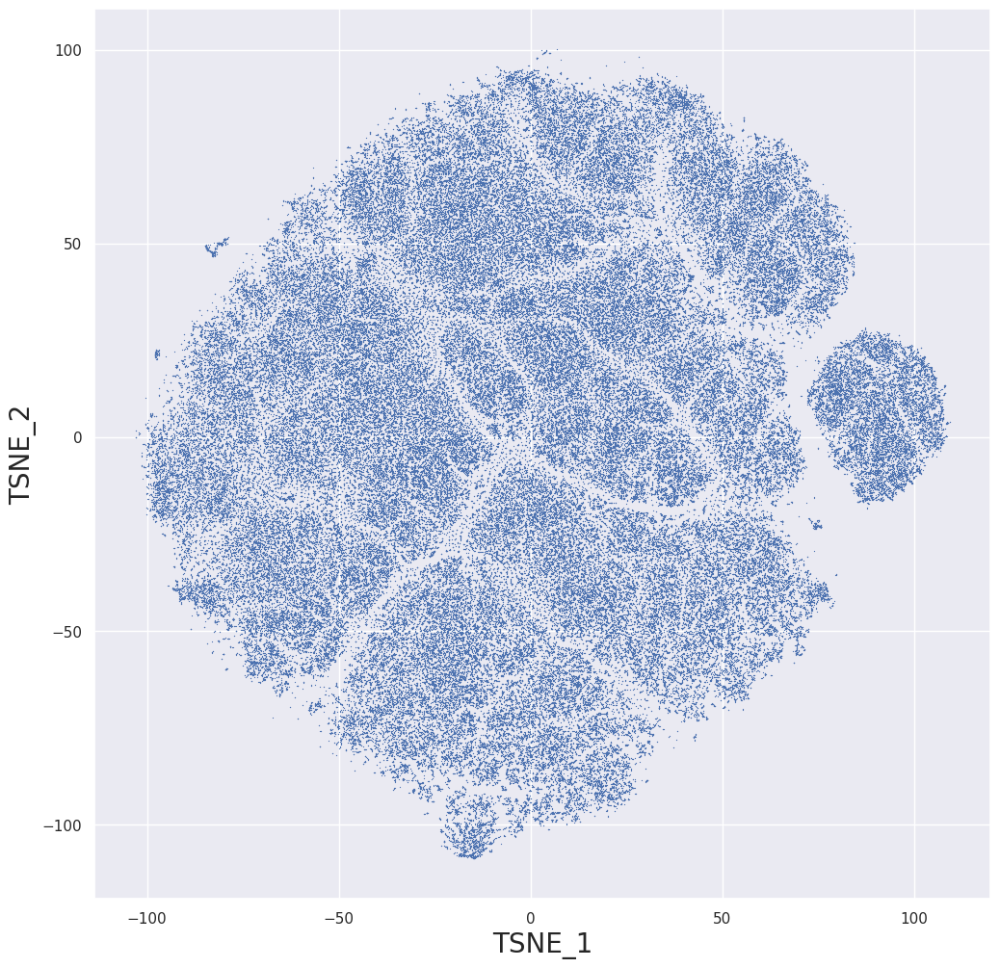

In [ ]:
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=df, x=df.iloc[:,0].values, y=df.iloc[:,1].values, s=0.8, linewidth=0)
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

output_file = f'{model_name}_{data}_{chain}_CDR3_{red}'
plt.savefig(f'{output_file}')

In [ ]:
!ls drive/MyDrive/Oslo/data/ireceptor/output/esm2

H_CDR3.pt  old	TSNE_H_CDR3.pkl  UMAP_H_CDR3.pkl


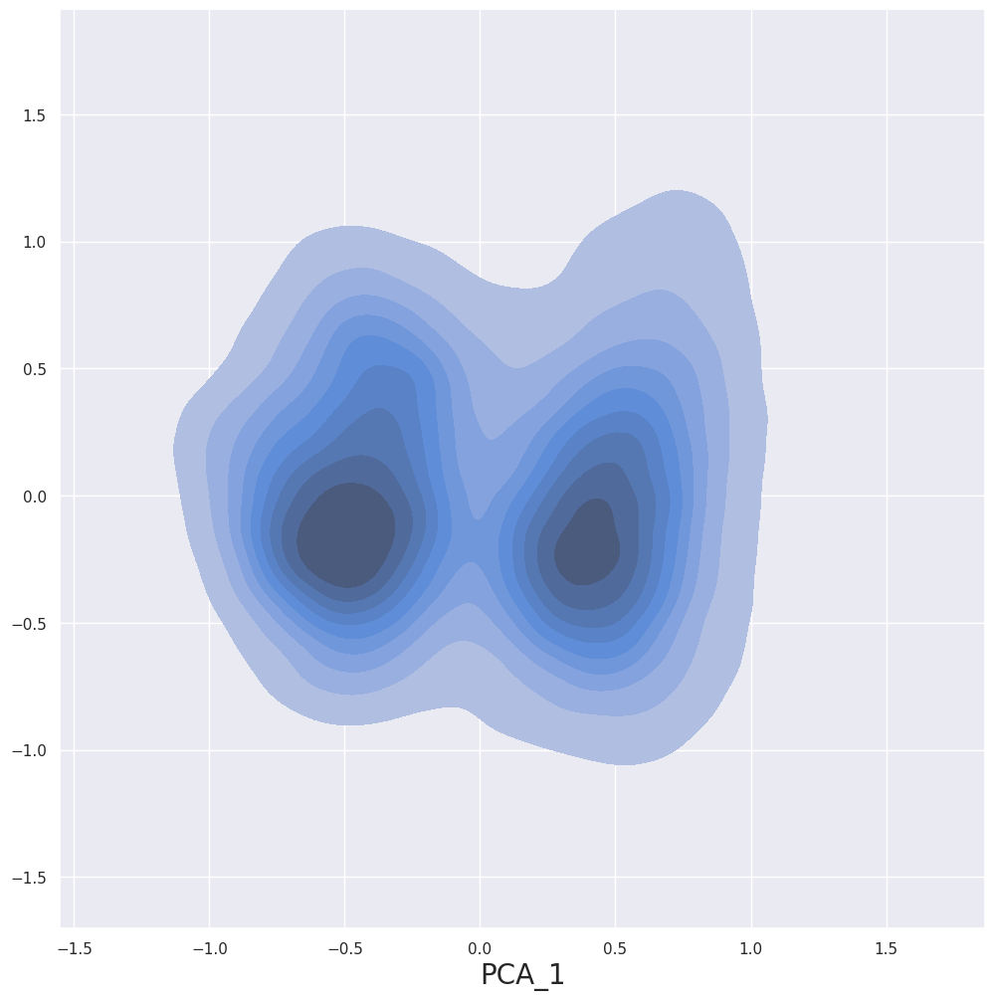

In [ ]:
plt.figure(figsize=(12, 12))
sns.kdeplot(data=df, x=df.iloc[:,0].values, y=df.iloc[:,1].values, fill=True)
plt.xlabel(f'{red}_1', fontsize=20)

output_file = f'{model_name}_{red}_{data}_KDE_{chain}_CDR3'
plt.savefig(f'{output_file}')

In [ ]:
!zip -r /content/pca.zip /content/*PCA*

  adding: content/esm2_RANDOM_H_CDR3_PCA.png (deflated 4%)
  adding: content/esm2_RANDOM_L_CDR3_PCA.png (deflated 4%)
  adding: content/esm2_REAL_H_CDR3_PCA.png (deflated 4%)
  adding: content/esm2_REAL_L_CDR3_PCA.png (deflated 3%)
  adding: content/prott5_RANDOM_H_CDR3_PCA.png (deflated 4%)
  adding: content/prott5_RANDOM_L_CDR3_PCA.png (deflated 4%)
  adding: content/prott5_REAL_H_CDR3_PCA.png (deflated 4%)
  adding: content/prott5_REAL_L_CDR3_PCA.png (deflated 3%)
